In [5]:
import pandas as pd
import os

big_frame = pd.DataFrame()

for file in os.listdir():
    if file.startswith('MX Master'):
        df = pd.read_csv(file,sep="|")
        big_frame = big_frame.append(df, ignore_index=True)


In [6]:
big_frame.shape

(33391, 9)

In [7]:
big_frame.head()

,Unnamed: 0,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date
0,0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master ...,Doug S,https://www.youtube.com/channel/UCKlUJYIprApAs...,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc...,The 1-second Bluetooth lag is caused by your W...,2019-02-07
1,1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master ...,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCH...,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc...,Hello Mattihas\r\nCould u plz suggest ergonomi...,2019-02-07
2,2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master ...,Ethan Wilson,https://www.youtube.com/channel/UCi4qyym_jvwhp...,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc...,Oops I accidentally watched a Matthias video t...,2019-02-07
3,3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master ...,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc...,99% of the mice on the market are less ergonom...,2019-02-07
4,4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master ...,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO...,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc...,this video deserved my first ever dislike afte...,2019-02-07


In [8]:
big_frame.isna().sum()

Unnamed: 0               0
video_id                 0
video_title              0
comment_author_name    220
comment_author_url       0
comment_published        0
comment_url              0
comment_text             4
extract_date             0
dtype: int64

In [9]:
big_frame.dropna(subset=["comment_text"],inplace=True)

In [10]:
from langdetect import detect
def detectlang(row):
    try:
        lang = detect(row['comment_text'])
        row['Language'] = lang
    except:
        row['Language'] = "error"
    return row

In [11]:
df = big_frame.apply(detectlang,axis=1)

In [12]:
df.to_csv("withlang.csv",sep="|",index=False)

In [13]:
import pandas as pd
df = pd.read_csv("withlang.csv",sep="|")

In [14]:
df.Language.value_counts()

en       18250
es        3230
de        1525
pt         949
fr         795
id         732
it         704
el         499
ko         488
et         464
ja         445
af         403
so         397
tl         379
ru         343
ro         298
pl         273
fi         248
da         224
nl         211
ca         194
error      189
no         177
cy         174
vi         170
hr         164
sw         159
sk         156
ar         136
sl         134
sv         123
tr         119
te         100
hu          78
cs          76
zh-cn       76
lt          55
sq          54
he          45
th          32
hi          26
bg          26
lv          18
fa          12
uk           8
mk           8
ur           6
kn           6
bn           4
zh-tw        3
ta           1
ne           1
Name: Language, dtype: int64

In [15]:
df_eng =  df[df.Language=="en"]

In [16]:
df_eng.shape

(18250, 10)

In [17]:
import re
df_eng_relvant = df_eng[df_eng.comment_text.str.contains('MX|master|mice|mouse|logitech|logi', flags=re.IGNORECASE, regex=True)]



In [18]:
df_eng_relvant.shape

(6279, 10)

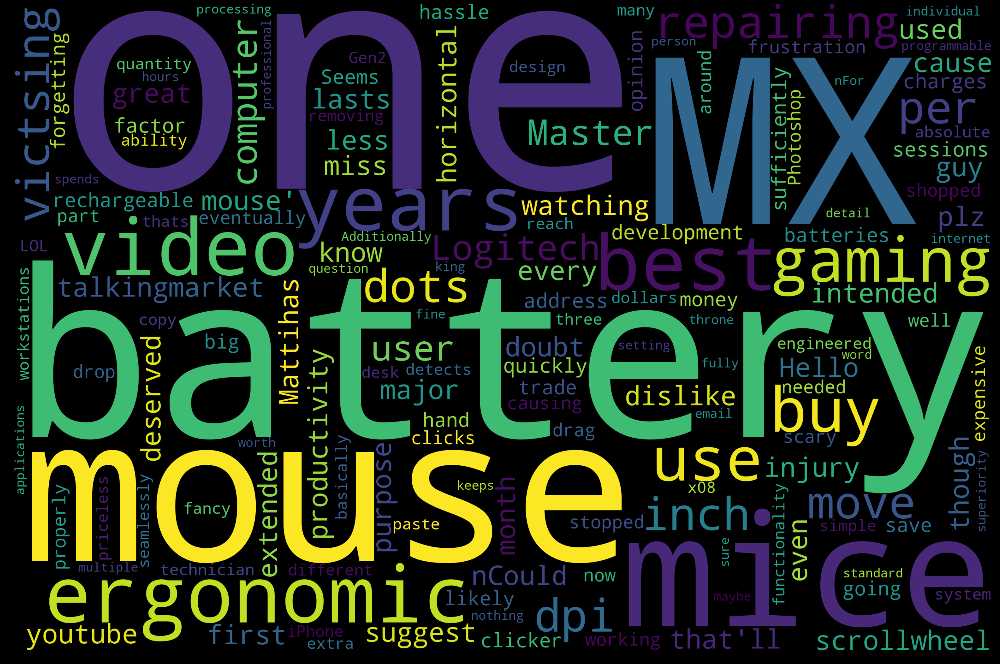

In [19]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
text = df_eng_relvant.comment_text.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

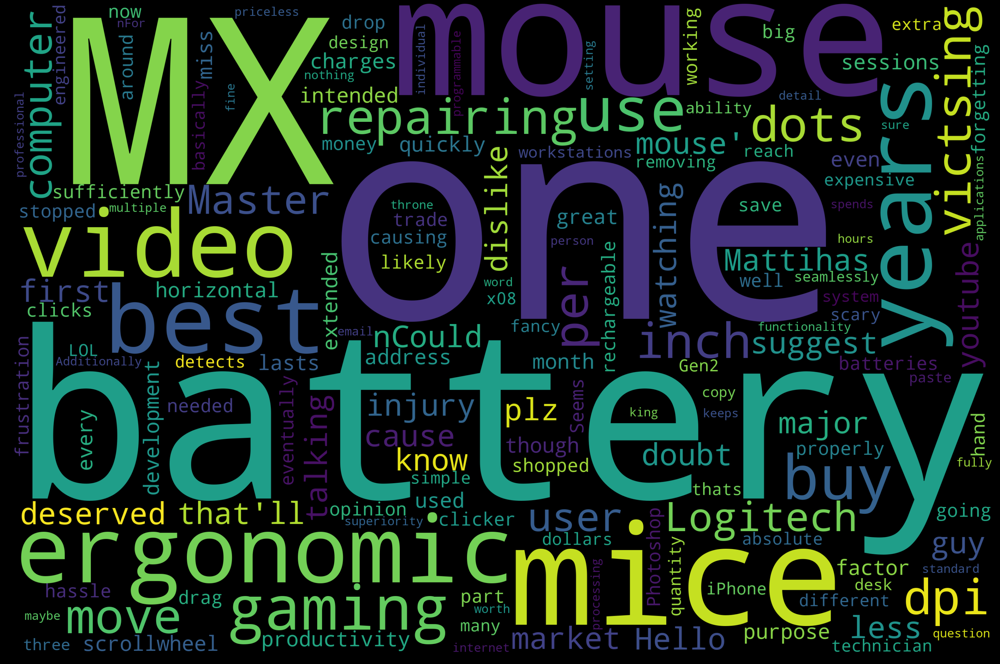

In [20]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
text = df_eng_relvant.comment_text.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [21]:
pd.set_option('display.max_colwidth', -1)

In [22]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains('frustration', flags=re.IGNORECASE, regex=True)].comment_text

6611     I'd keep my new Master 2S mouse if my old MBP had Bluetooth 4.0. I have Apple Magic Mouse (1st gen) and honestly I don't understand why it still costs $79. This thing inflicts pain on my wrist and I'm pretty sure it'll contribute to the development of carpel tunnel syndrome.  The Magic Mouse is a nightmare when you're editing stuff on Photoshop (don't ever use it for PC gaming). The Magic Mouse has a crappy navigational feature. I'd literally scream in frustration every time the PS canvas moves around like a child with ADHD. I prefer to have a mouse with a scroll ball and left/right buttons.              
33381    You didn't address the battery factor sufficiently.  The rechargeable battery is likely to save you more money on batteries (in my opinion) and the hassle of going out to buy them (or forgetting to buy them). Seems like a big trade off for me.  On the other hand, my MX mouse clicker eventually stopped working properly after about 5 years and now over-clicks causing f

In [23]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains('ergonomic', flags=re.IGNORECASE, regex=True)].comment_text

1        Hello Mattihas\r\nCould u plz suggest ergonomics mouse                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [24]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains('repairing', flags=re.IGNORECASE, regex=True)].comment_text

13925    For me the ergonomics have gotten steadily worse. The revolution being the best. I find the revolution superior in ergo and thus have two of them that I keep repairing to keep alive. The Master caused me enough pain within the first week of usage that I could not mouse for the following week at all.                                                                                                                                                                                                                                                                                                                        
33381    You didn't address the battery factor sufficiently.  The rechargeable battery is likely to save you more money on batteries (in my opinion) and the hassle of going out to buy them (or forgetting to buy them). Seems like a big trade off for me.  On the other hand, my MX mouse clicker eventually stopped working properly after about 5 years and now over-clicks causing f

In [25]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains('battery', flags=re.IGNORECASE, regex=True)].comment_text

4        this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [26]:
a = df_eng_relvant[df_eng_relvant.comment_text.str.contains('battery', flags=re.IGNORECASE, regex=True)].comment_text.to_string()

In [27]:
a.split('. ')
[t for t in a.split('. ') if 'battery' in t]


['But I have had the mouse for years now, almost all symbols and logos are gone now because of much usage, battery still works great though',
 'In my honest opinion, the Master has better battery life so far, and has this horizontal scrolling wheel which can be used while browsing and using certain programs, as compared to the horizontal pushing of the wheel',
 '                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [28]:
import spacy
import pandas as pd
import numpy as np
import nltk
from nltk.tokenize.toktok import ToktokTokenizer
import re
from bs4 import BeautifulSoup
from contractions import CONTRACTION_MAP
import unicodedata

nlp = spacy.load('en', parse = True, tag=True, entity=True)
#nlp_vec = spacy.load('en_vecs', parse = True, tag=True, entity=True)
tokenizer = ToktokTokenizer()
stopword_list = nltk.corpus.stopwords.words('english')
stopword_list.remove('no')
stopword_list.remove('not')

In [29]:
def strip_html_tags(text):
    soup = BeautifulSoup(text, "html.parser")
    stripped_text = soup.get_text()
    return stripped_text

strip_html_tags('<html><h2>Some important text</h2></html>')

'Some important text'

In [30]:
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

remove_accented_chars('Sómě Áccěntěd těxt')

'Some Accented text'

In [31]:
def expand_contractions(text, contraction_mapping=CONTRACTION_MAP):
    
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())), 
                                      flags=re.IGNORECASE|re.DOTALL)
    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
                                if contraction_mapping.get(match)\
                                else contraction_mapping.get(match.lower())                       
        expanded_contraction = first_char+expanded_contraction[1:]
        return expanded_contraction
        
    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text

expand_contractions("Y'all can't expand contractions I'd think")

'You all cannot expand contractions I would think'

In [32]:
def remove_special_characters(text, remove_digits=False):
    pattern = r'[^a-zA-Z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, '', text)
    return text

remove_special_characters("Well this was fun! What do you think? 123#@!", 
                          remove_digits=True)

'Well this was fun What do you think '

In [33]:
def lemmatize_text(text):
    text = nlp(text)
    text = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in text])
    return text

lemmatize_text("My system keeps crashing! his crashed yesterday, ours crashes daily")

'My system keep crash ! his crashed yesterday , ours crash daily'

In [34]:
def simple_stemmer(text):
    ps = nltk.porter.PorterStemmer()
    text = ' '.join([ps.stem(word) for word in text.split()])
    return text

simple_stemmer("My system keeps crashing his crashed yesterday, ours crashes daily")

'My system keep crash hi crash yesterday, our crash daili'

In [35]:
def remove_stopwords(text, is_lower_case=False):
    tokens = tokenizer.tokenize(text)
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stopword_list]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)    
    return filtered_text

remove_stopwords("The, and, if are stopwords, computer is not")

', , stopwords , computer not'

In [36]:
def normalize_corpus(corpus, html_stripping=True, contraction_expansion=True,
                     accented_char_removal=True, text_lower_case=True, 
                     text_lemmatization=True, special_char_removal=True, 
                     stopword_removal=True, remove_digits=True):
    
    normalized_corpus = []
    # normalize each document in the corpus
    for doc in corpus:
        # strip HTML
        if html_stripping:
            doc = strip_html_tags(doc)
        # remove accented characters
        if accented_char_removal:
            doc = remove_accented_chars(doc)
        # expand contractions    
        if contraction_expansion:
            doc = expand_contractions(doc)
        # lowercase the text    
        if text_lower_case:
            doc = doc.lower()
        # remove extra newlines
        doc = re.sub(r'[\r|\n|\r\n]+', ' ',doc)
        # lemmatize text
        if text_lemmatization:
            doc = lemmatize_text(doc)
        # remove special characters and\or digits    
        if special_char_removal:
            # insert spaces between special characters to isolate them    
            special_char_pattern = re.compile(r'([{.(-)!}])')
            doc = special_char_pattern.sub(" \\1 ", doc)
            doc = remove_special_characters(doc, remove_digits=remove_digits)  
        # remove extra whitespace
        doc = re.sub(' +', ' ', doc)
        # remove stopwords
        if stopword_removal:
            doc = remove_stopwords(doc, is_lower_case=text_lower_case)
            
        normalized_corpus.append(doc)
        
    return normalized_corpus

In [37]:
df_eng_relvant['clean_text'] = normalize_corpus(df_eng_relvant['comment_text'])
#norm_corpus = list(news_df['clean_text'])
#news_df.iloc[1][['full_text', 'clean_text']].to_dict()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [38]:
df_eng_relvant['clean_text']

1        hello mattiha could u plz suggest ergonomic mouse                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [39]:
from afinn import Afinn

af = Afinn()

In [40]:
df_eng_relvant['clean_text'] = normalize_corpus(df_eng_relvant['comment_text'], text_lower_case=True, 
                          text_lemmatization=False, special_char_removal=True,stopword_removal=False)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [41]:
df_eng_relvant['clean_text']

1        hello mattihas could u plz suggest ergonomics mouse                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [42]:
df_eng_relvant.reset_index(drop=True,inplace=True)

In [43]:
df_eng_relvant.drop(columns="Unnamed: 0", inplace=True)

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [44]:
df_eng_relvant

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,of the mice on the market are less ergonomic than this one i doubt this is the one thatll cause major injury
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,this video deserved my first ever dislike after years of watching videos on youtube this guy does not know what he is talking about this is one of the best mice for productivity if not the best once you used a horizontal scrollwheel you miss it on every other mouse it is also great for gaming even though that is not its intended purpose battery lasts about a month with my use extended development sessions and it charges very quickly
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,i use my mouse for many hours a day with my wrist and hand horizontal using the corsair m and have never had a problem nothing about a more vertical hand position feels more natural to me it is fine if you want to say that it is not a good position for you or it is not ergonomically optimal but you should really be careful implying that the average user is going to have a problem with it and get injured it is far more ergonomic than the average mouse and millions of people use standard mice for many hours a day without injury
4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,WhiteHawk,https://www.youtube.com/user/WhiteHawk7798,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Uggbd58EAILJnXgCoAEC,"Be warned people, this mouse has a major design flaw with the wheel which will break and get stuck in free wheeling mode, sending mine back for a refund as Amazon don't have any more and just as well as I'd probably get another failure soon, I'd hardly used the mouse and they haven't fixed the issue, lots of people having this happen.",2019-02-07,en,be warned people this mouse has a major design flaw with the wheel which will break and get stuck in fre

In [46]:

df_eng_relvant["sentiment_scores_afin"] = [af.score(comment) for comment in df_eng_relvant["clean_text"]]
df_eng_relvant["sentiment_category_afin"] = ['positive' if score > 0 
                          else 'negative' if score < 0 
                              else 'neutral' 
                                  for score in df_eng_relvant["sentiment_scores_afin"]]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [47]:
df_eng_relvant.sentiment_category_afin.value_counts()

positive    3627
neutral     1676
negative    976 
Name: sentiment_category_afin, dtype: int64

In [49]:
from textblob import TextBlob

df_eng_relvant["sentiment_scores_tb"] = [round(TextBlob(comment).sentiment.polarity, 3) for comment in df_eng_relvant['clean_text']]
df_eng_relvant["sentiment_category_tb"] = ['positive' if score > 0 
                             else 'negative' if score < 0 
                                 else 'neutral' 
                                     for score in df_eng_relvant["sentiment_scores_tb"]]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [50]:
df_eng_relvant.sentiment_category_tb.value_counts()

positive    3947
neutral     1512
negative    820 
Name: sentiment_category_tb, dtype: int64

In [52]:

import model_evaluation_utils as meu
meu.display_confusion_matrix_pretty(true_labels=df_eng_relvant["sentiment_category_afin"], 
                                    predicted_labels=df_eng_relvant["sentiment_category_tb"], 
                                    classes=['negative', 'neutral', 'positive'])

Predicted:                 
                   negative neutral positive
Actual: negative  451        154     371    
        neutral   182        1034    460    
        positive  187        324     3116

In [56]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
def vader_sentiment(x):
    stats = analyzer.polarity_scores(x)
    del stats['compound']
    key, value = max(stats.items(), key=lambda x:x[1])
    return key, value

In [57]:
df_eng_relvant["sentiment_category_vader"],df_eng_relvant["sentiment_scores_vader"] = zip(*df_eng_relvant.clean_text.apply(vader_sentiment))
                                                                                                                       

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [58]:
df_eng_relvant["sentiment_category_vader"].value_counts()

neu    6030
pos    226 
neg    23  
Name: sentiment_category_vader, dtype: int64

In [59]:
df_eng_relvant.sentiment_category_vader.replace({"neu":"neutral","pos":"positive","neg":"negative"},inplace=True)

/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:5890: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


In [60]:
df_eng_relvant["sentiment_category_vader"].value_counts()

neutral     6030
positive    226 
negative    23  
Name: sentiment_category_vader, dtype: int64

In [61]:
import indicoio
indicoio.config.api_key = 'cc9302ad9499c2280755c0b30e6b9f9e'

In [62]:
df_eng_relvant["sentiment_scores_indicoio"] = indicoio.sentiment([comment for comment in df_eng_relvant["clean_text"]])

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [63]:
clean_list = list(df_eng_relvant["clean_text"])

In [64]:
#df_eng_relvant["sentiment_scores_indicoio_hq"] = 
clean_list_result1 =   indicoio.sentiment_hq(clean_list[0:3000])
clean_list_result2 =   indicoio.sentiment_hq(clean_list[3000:])


In [65]:
clean_list_result = clean_list_result1+clean_list_result2

In [69]:
df_eng_relvant["sentiment_scores_indicoio_hq"] = clean_list_result

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [70]:
df_eng_relvant.head(30)

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text,sentiment_scores_afin,sentiment_category_afin,sentiment_scores_tb,sentiment_category_tb,sentiment_category_vader,sentiment_scores_vader,sentiment_scores_indicoio,sentiment_scores_indicoio_hq
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse,0.0,neutral,0.000,neutral,neutral,0.822,0.153283,0.325212
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,of the mice on the market are less ergonomic than this one i doubt this is the one thatll cause major injury,-3.0,negative,-0.052,negative,neutral,0.782,0.104979,0.171722
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,this video deserved my first ever dislike after years of watching videos on youtube this guy does not know what he is talking about this is one of the best mice for productivity if not the best once you used a horizontal scrollwheel you miss it on every other mouse it is also great for gaming even though that is not its intended purpose battery lasts about a month with my use extended development sessions and it charges very quickly,3.0,positive,0.560,positive,neutral,0.793,0.978070,0.989882
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,i use my mouse for many hours a day with my wrist and hand horizontal using the corsair m and have never had a problem nothing about a more vertical hand position feels more natural to me it is fine if you want to say that it is not a good position for you or it is not ergonomically optimal but you should really be careful implying that the average user is going to have a problem with it and get injured it is far more ergonomic than the average mouse and millions of people use standard mice for many hours a day without injury,1.0,positive,0.182,positive,neutral,0.771,0.249153,0.620846
4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,WhiteHawk,https://www.youtube.com/user/WhiteHawk7798,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Uggbd58EAILJnXgCoAEC,"Be warned people, this mo

In [71]:
df_eng_relvant.comment_text[27]

"I bought the mx master and didn't like it at all. Gonna return it and post my own video review later."

In [72]:
df_eng_relvant.loc[df_eng_relvant.sentiment_scores_indicoio>0.6,"sentiment_category_indicoio"] = "positive"
df_eng_relvant.loc[df_eng_relvant.sentiment_scores_indicoio<0.4,"sentiment_category_indicoio"] = "negative"
df_eng_relvant.loc[((df_eng_relvant.sentiment_scores_indicoio>=0.4) & (df_eng_relvant.sentiment_scores_indicoio<=0.6)),"sentiment_category_indicoio"] = "neutral"



/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [73]:
df_eng_relvant.head(50)

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text,sentiment_scores_afin,sentiment_category_afin,sentiment_scores_tb,sentiment_category_tb,sentiment_category_vader,sentiment_scores_vader,sentiment_scores_indicoio,sentiment_scores_indicoio_hq,sentiment_category_indicoio
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse,0.0,neutral,0.000,neutral,neutral,0.822,0.153283,0.325212,negative
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,of the mice on the market are less ergonomic than this one i doubt this is the one thatll cause major injury,-3.0,negative,-0.052,negative,neutral,0.782,0.104979,0.171722,negative
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,this video deserved my first ever dislike after years of watching videos on youtube this guy does not know what he is talking about this is one of the best mice for productivity if not the best once you used a horizontal scrollwheel you miss it on every other mouse it is also great for gaming even though that is not its intended purpose battery lasts about a month with my use extended development sessions and it charges very quickly,3.0,positive,0.560,positive,neutral,0.793,0.978070,0.989882,positive
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,i use my mouse for many hours a day with my wrist and hand horizontal using the corsair m and have never had a problem nothing about a more vertical hand position feels more natural to me it is fine if you want to say that it is not a good position for you or it is not ergonomically optimal but you should really be careful implying that the average user is going to have a problem with it and get injured it is far more ergonomic than the average mouse and millions of people use standard mice for many hours a day without injury,1.0,positive,0.182,positive,neutral,0.771,0.249153,0.620846,negative
4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,WhiteHawk,https://www.youtube.com/user/WhiteHawk7798,2 years ago,https://www.youtube.com/watch?

In [74]:
df_eng_relvant.comment_text[44]

'What do you mean power users cant use it MKBHD, Joanathan Morrision,Lui(Unbox Therapy),Austin Evans, UrAvgConsumer some of the biggest names in tech use this mouse.'

In [75]:
df_eng_relvant.loc[df_eng_relvant.sentiment_scores_indicoio_hq>0.6,"sentiment_category_indicoio_hq"] = "positive"
df_eng_relvant.loc[df_eng_relvant.sentiment_scores_indicoio_hq<0.4,"sentiment_category_indicoio_hq"] = "negative"
df_eng_relvant.loc[((df_eng_relvant.sentiment_scores_indicoio_hq>=0.4) & (df_eng_relvant.sentiment_scores_indicoio_hq<=0.6)),"sentiment_category_indicoio_hq"] = "neutral"



/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [76]:
df_eng_relvant.head(10)

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text,sentiment_scores_afin,sentiment_category_afin,sentiment_scores_tb,sentiment_category_tb,sentiment_category_vader,sentiment_scores_vader,sentiment_scores_indicoio,sentiment_scores_indicoio_hq,sentiment_category_indicoio,sentiment_category_indicoio_hq
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse,0.0,neutral,0.000,neutral,neutral,0.822,0.153283,0.325212,negative,negative
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,of the mice on the market are less ergonomic than this one i doubt this is the one thatll cause major injury,-3.0,negative,-0.052,negative,neutral,0.782,0.104979,0.171722,negative,negative
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,this video deserved my first ever dislike after years of watching videos on youtube this guy does not know what he is talking about this is one of the best mice for productivity if not the best once you used a horizontal scrollwheel you miss it on every other mouse it is also great for gaming even though that is not its intended purpose battery lasts about a month with my use extended development sessions and it charges very quickly,3.0,positive,0.560,positive,neutral,0.793,0.978070,0.989882,positive,positive
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,i use my mouse for many hours a day with my wrist and hand horizontal using the corsair m and have never had a problem nothing about a more vertical hand position feels more natural to me it is fine if you want to say that it is not a good position for you or it is not ergonomically optimal but you should really be careful implying that the average user is going to have a problem with it and get injured it is far more ergonomic than the average mouse and millions of people use standard mice for many hours a day without injury,1.0,positive,0.182,positive,neutral,0.771,0.249153,0.620846,negative,positive
4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,WhiteHawk,https://www.youtub

In [77]:
df_eng_relvant.comment_text[8]

"I have suffered from carpal tunnel, but this mouse has only improved things. I find the angle perfect, unlike the awkwardly vertical models that actually cause the same pain I get with a tablet. Like Oktay I also use Wacom, but because I draw. I don't recommend a tablet for anyone with carpal tunnel."

In [78]:
sentiment_category = df_eng_relvant[["sentiment_category_afin","sentiment_category_tb","sentiment_category_vader","sentiment_category_indicoio","sentiment_category_indicoio_hq"]].mode(axis = 1)


In [79]:
sentiment_category.notna().sum()

0    6279
1    1316
dtype: int64

In [80]:
sentiment_category

,0,1
0,neutral,NaN
1,negative,NaN
2,positive,NaN
3,positive,NaN
4,negative,NaN
5,negative,positive
6,negative,NaN
7,negative,positive
8,neutral,positive
9,negative,NaN


In [81]:
sentiment_category.columns = ["mode0","mode1"]

In [82]:
df_eng_relvant = pd.concat([df_eng_relvant,sentiment_category],axis=1)

In [83]:
def check(x):
    if pd.isna(x["mode1"]):
        return x["sentiment_category_indicoio_hq"]
    else:
        return x["mode0"]
    

In [84]:
df_eng_relvant["final_sentiment_category"] = df_eng_relvant.apply(lambda x: check(x),axis=1)

In [85]:
df_eng_relvant.final_sentiment_category.value_counts()

positive    2677
negative    2360
neutral     1242
Name: final_sentiment_category, dtype: int64

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
text = df_eng_relvant[df_eng_relvant.final_sentiment_category=="positive"].comment_text.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
text = df_eng_relvant[df_eng_relvant.final_sentiment_category=="negative"].comment_text.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
text = df_eng_relvant[df_eng_relvant.final_sentiment_category=="neutral"].comment_text.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
df_eng_relvant.to_csv("MXMas_sentiment.csv",index=False,sep="|")

In [ ]:
df_eng_relvant = pd.read_csv("MXMas_sentiment.csv",sep="|")

In [106]:
df_eng_relvant.head()

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text,...,sentiment_scores_vader,sentiment_scores_indicoio,sentiment_scores_indicoio_hq,sentiment_category_indicoio,sentiment_category_indicoio_hq,mode0,mode1,final_sentiment_category,mode0,mode1
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse,...,0.822,0.153283,0.325212,negative,negative,neutral,NaN,negative,neutral,NaN
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,of the mice on the market are less ergonomic than this one i doubt this is the one thatll cause major injury,...,0.782,0.104979,0.171722,negative,negative,negative,NaN,negative,negative,NaN
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,this video deserved my first ever dislike after years of watching videos on youtube this guy does not know what he is talking about this is one of the best mice for productivity if not the best once you used a horizontal scrollwheel you miss it on every other mouse it is also great for gaming even though that is not its intended purpose battery lasts about a month with my use extended development sessions and it charges very quickly,...,0.793,0.978070,0.989882,positive,positive,positive,NaN,positive,positive,NaN
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,i use my mouse for many hours a day with my wrist and hand horizontal using the corsair m and have never had a problem nothing about a more vertical hand position feels more natural to me it is fine if you want to say that it is not a good position for you or it is not ergonomically optimal but you should really be careful implying that the average user is going to have a problem with it and get injured it is far more ergonomic than the average mouse and millions of people use standard mice for many hours a day without injury,...,0.771,0.249153,0.620846,negative,positive,positive,NaN,positive,positive,NaN
4,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,WhiteHawk,https://www.youtube.com/user/WhiteHawk7798,2 years ago,https://www.y

In [107]:
df_eng_relvant["clean_text"] = normalize_corpus(df_eng_relvant['comment_text'], text_lower_case=True, 
                               text_lemmatization=False, special_char_removal=True,stopword_removal=True)

In [108]:
sentence = str(df_eng_relvant.iloc[3].clean_text)
sentence_nlp = nlp(sentence)

In [109]:
spacy_pos_tagged = [(word, word.tag_, word.pos_) for word in sentence_nlp]
pd.DataFrame(spacy_pos_tagged, columns=['Word', 'POS tag', 'Tag type'])


,Word,POS tag,Tag type
0,use,NN,NOUN
1,mouse,NN,NOUN
2,many,JJ,ADJ
3,hours,NNS,NOUN
4,day,NN,NOUN
5,wrist,NN,NOUN
6,hand,NN,NOUN
7,horizontal,JJ,ADJ
8,using,VBG,VERB
9,corsair,NN,NOUN


In [110]:
nltk_pos_tagged = nltk.pos_tag(sentence.split())
pd.DataFrame(nltk_pos_tagged, columns=['Word', 'POS tag'])

,Word,POS tag
0,use,NN
1,mouse,VBD
2,many,JJ
3,hours,NNS
4,day,NN
5,wrist,JJ
6,hand,NN
7,horizontal,NN
8,using,VBG
9,corsair,NN


In [111]:
dependency_pattern = '{left}<---{word}[{w_type}]--->{right}\n--------'
for token in sentence_nlp:
    print(dependency_pattern.format(word=token.orth_, 
                                  w_type=token.dep_,
                                  left=[t.orth_ 
                                            for t 
                                            in token.lefts],
                                  right=[t.orth_ 
                                             for t 
                                             in token.rights]))

[]<---use[ROOT]--->['mouse']
--------
[]<---mouse[dobj]--->[]
--------
[]<---many[amod]--->[]
--------
['many']<---hours[compound]--->[]
--------
['hours']<---day[compound]--->[]
--------
['day']<---wrist[nsubj]--->['horizontal', 'using']
--------
[]<---hand[compound]--->[]
--------
['hand']<---horizontal[amod]--->[]
--------
[]<---using[acl]--->['corsair']
--------
[]<---corsair[dobj]--->[]
--------
[]<---never[neg]--->[]
--------
['wrist', 'never']<---problem[ROOT]--->['nothing']
--------
[]<---nothing[dobj]--->['feels']
--------
[]<---vertical[amod]--->[]
--------
[]<---hand[compound]--->[]
--------
['vertical', 'hand']<---position[nsubj]--->[]
--------
['position']<---feels[relcl]--->['say', 'careful']
--------
[]<---natural[amod]--->[]
--------
['natural']<---fine[amod]--->[]
--------
['fine']<---want[nsubj]--->[]
--------
['want']<---say[ccomp]--->['optimal']
--------
[]<---not[neg]--->[]
--------
['not']<---good[amod]--->[]
--------
['good']<---position[nsubj]--->[]
--------
[]<

In [112]:
from spacy import displacy

displacy.render(sentence_nlp, jupyter=True, 
                options={'distance': 110,
                         'arrow_stroke': 2,
                         'arrow_width': 8})

In [113]:
sentence = str(df_eng_relvant.iloc[7].clean_text)
sentence_nlp = nlp(sentence)

In [114]:
print([(word, word.ent_type_) for word in sentence_nlp if word.ent_type_])


[(years, 'DATE'), (five, 'DATE'), (years, 'DATE'), (ago, 'DATE')]


In [115]:
displacy.render(sentence_nlp, style='ent', jupyter=True)


In [116]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [117]:
named_entities = []
for sentence in df_eng_relvant["clean_text"]:
    temp_entity_name = ''
    temp_named_entity = None
    sentence = nlp(sentence)
    for word in sentence:
        term = word.text 
        tag = word.ent_type_
        if tag:
            temp_entity_name = ' '.join([temp_entity_name, term]).strip()
            temp_named_entity = (temp_entity_name, tag)
        else:
            if temp_named_entity:
                named_entities.append(temp_named_entity)
                temp_entity_name = ''
                temp_named_entity = None

entity_frame = pd.DataFrame(named_entities, 
                            columns=['Entity Name', 'Entity Type'])

In [118]:
pd.options.display.max_seq_items = 2000


In [119]:
top_entities = (entity_frame.groupby(by=['Entity Name', 'Entity Type'])
                           .size()
                           .sort_values(ascending=False)
                           .reset_index().rename(columns={0 : 'Frequency'}))
top_entities.T.iloc[:,:40]

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
Entity Name,one,years,first,two,second,months,today,daily,days,year,...,month ago,mm,tomorrow,two years,one year,four,christmas,last week,everyday,one day
Entity Type,CARDINAL,DATE,ORDINAL,CARDINAL,ORDINAL,DATE,DATE,DATE,DATE,DATE,...,DATE,PERSON,DATE,DATE,DATE,CARDINAL,DATE,DATE,DATE,DATE
Frequency,575,177,128,121,57,55,51,48,44,37,...,7,7,7,7,6,6,6,6,5,5


In [120]:
top_entities = (entity_frame.groupby(by=['Entity Type'])
                           .size()
                           .sort_values(ascending=False)
                           .reset_index().rename(columns={0 : 'Frequency'}))
top_entities.T.iloc[:,:15]

,0,1,2,3,4,5,6,7,8,9,10
Entity Type,DATE,CARDINAL,ORDINAL,TIME,MONEY,PERSON,GPE,QUANTITY,NORP,PERCENT,ORG
Frequency,1002,823,215,119,13,12,10,8,5,1,1


In [121]:
top_entities = (entity_frame.groupby(by=['Entity Name', 'Entity Type'])
                           .size()
                           .sort_values(ascending=False)
                           .reset_index().rename(columns={0 : 'Frequency'}))
top_entities.head(55)

,Entity Name,Entity Type,Frequency
0,one,CARDINAL,575
1,years,DATE,177
2,first,ORDINAL,128
3,two,CARDINAL,121
4,second,ORDINAL,57
5,months,DATE,55
6,today,DATE,51
7,daily,DATE,48
8,days,DATE,44
9,year,DATE,37


In [122]:
top_entities[top_entities["Entity Type"]=="GPE"]

,Entity Name,Entity Type,Frequency
59,india,GPE,4
110,china,GPE,2
113,vietnam,GPE,2
122,japan,GPE,1
334,mexico,GPE,1


In [123]:
top_entities = (entity_frame.groupby(by=['Entity Type'])
                           .size()
                           .sort_values(ascending=False)
                           .reset_index().rename(columns={0 : 'Frequency'}))
top_entities.head(20)

,Entity Type,Frequency
0,DATE,1002
1,CARDINAL,823
2,ORDINAL,215
3,TIME,119
4,MONEY,13
5,PERSON,12
6,GPE,10
7,QUANTITY,8
8,NORP,5
9,PERCENT,1


In [124]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(min_df=0., max_df=1.)
cv_matrix = cv.fit_transform(df_eng_relvant["clean_text"])
cv_matrix = cv_matrix.toarray()
cv_matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [125]:

# get all unique words in the corpus
vocab = cv.get_feature_names()
# show document feature vectors
pd.DataFrame(cv_matrix, columns=vocab)

,aa,aaa,aaaaaand,aaalways,aaand,aaarg,aadhar,aamazon,abandon,abc,...,zoom,zooming,zoomingin,zooms,zoomwheel,zowie,zowies,zs,zulege,zzz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [126]:
# you can set the n-gram range to 1,2 to get unigrams as well as bigrams
bv = CountVectorizer(ngram_range=(2,2))
bv_matrix = bv.fit_transform(df_eng_relvant["clean_text"])

bv_matrix = bv_matrix.toarray()
vocab = bv.get_feature_names()
pd.DataFrame(bv_matrix, columns=vocab)

,aa alkalines,aa batteries,aa battery,aa duracell,aa nimh,aa rechargeable,aa rechargeables,aaa batteries,aaa battery,aaa games,...,zowie fk,zowie logitech,zowie mice,zowie mouses,zowie thumbs,zowie za,zowies never,zs blow,zulege falls,zzz put
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [127]:
from sklearn.feature_extraction.text import TfidfVectorizer

tv = TfidfVectorizer(min_df=0., max_df=1., use_idf=True)
tv_matrix = tv.fit_transform(df_eng_relvant["clean_text"])
tv_matrix = tv_matrix.toarray()

vocab = tv.get_feature_names()
pd.DataFrame(np.round(tv_matrix, 2), columns=vocab)

,aa,aaa,aaaaaand,aaalways,aaand,aaarg,aadhar,aamazon,abandon,abc,...,zoom,zooming,zoomingin,zooms,zoomwheel,zowie,zowies,zs,zulege,zzz
0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0


In [128]:

from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(tv_matrix)
similarity_df = pd.DataFrame(similarity_matrix)
similarity_df

,0,1,2,3,4,5,6,7,8,9,...,6269,6270,6271,6272,6273,6274,6275,6276,6277,6278
0,1.000000,0.000000,0.003403,0.005508,0.007225,0.023750,0.005347,0.016744,0.003251,0.000000,...,0.031159,0.004109,0.000000,0.005923,0.014672,0.012661,0.004388,0.002483,0.000000,0.002434
1,0.000000,1.000000,0.040658,0.123064,0.061247,0.073054,0.094218,0.032127,0.048209,0.000000,...,0.000000,0.000000,0.018163,0.000000,0.020059,0.000000,0.000000,0.000000,0.000000,0.018303
2,0.003403,0.040658,1.000000,0.060255,0.043325,0.076072,0.062570,0.061563,0.030979,0.025212,...,0.203911,0.014294,0.013103,0.040440,0.057409,0.053276,0.002043,0.049238,0.007617,0.020276
3,0.005508,0.123064,0.060255,1.000000,0.066473,0.143994,0.099350,0.137890,0.043581,0.054666,...,0.023480,0.024607,0.007474,0.016810,0.021329,0.084935,0.034371,0.034947,0.026318,0.114873
4,0.007225,0.061247,0.043325,0.066473,1.000000,0.105331,0.034955,0.049195,0.033032,0.000000,...,0.030801,0.004062,0.017655,0.022051,0.078971,0.084983,0.004337,0.033717,0.000000,0.009062
5,0.023750,0.073054,0.076072,0.143994,0.105331,1.000000,0.079855,0.124426,0.031011,0.068605,...,0.195676,0.021601,0.024545,0.055583,0.125292,0.044968,0.090330,0.042329,0.044594,0.048091
6,0.005347,0.094218,0.062570,0.099350,0.034955,0.079855,1.000000,0.064485,0.074579,0.016296,...,0.022796,0.025868,0.025767,0.016321,0.043119,0.042315,0.023942,0.028085,0.006745,0.023973
7,0.016744,0.032127,0.061563,0.137890,0.049195,0.124426,0.064485,1.000000,0.185845,0.120505,...,0.071384,0.044724,0.012852,0.013570,0.073824,0.125715,0.031692,0.053254,0.014080,0.064316
8,0.003251,0.048209,0.030979,0.043581,0.033032,0.031011,0.074579,0.185845,1.000000,0.000000,...,0.013860,0.001828,0.019459,0.009922,0.030444,0.005632,0.001952,0.008946,0.000000,0.013159
9,0.000000,0.000000,0.025212,0.054666,0.000000,0.068605,0.016296,0.120505,0.000000,1.000000,...,0.000000,0.010644,0.045262,0.057605,0.000000,0.128263,0.015375,0.024832,0.000000,0.066752


In [129]:
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(similarity_matrix, 'ward')
pd.DataFrame(Z, columns=['Document\Cluster 1', 'Document\Cluster 2', 
                         'Distance', 'Cluster Size'], dtype='object')

,Document\Cluster 1,Document\Cluster 2,Distance,Cluster Size
0,6143,6144,0,2
1,5719,5765,0,2
2,888,902,0,2
3,3251,3329,0,2
4,853,6128,0,2
5,3315,3477,0,2
6,861,1919,0,2
7,4160,4215,0,2
8,2004,2177,0,2
9,2746,6287,0,3


In [130]:
%matplotlib inline

<Figure size 576x216 with 0 Axes>

Text(0.5,1,'Hierarchical Clustering Dendrogram')

Text(0.5,0,'Data point')

Text(0,0.5,'Distance')

ValueError: Linkage 'Z' uses the same cluster more than once.

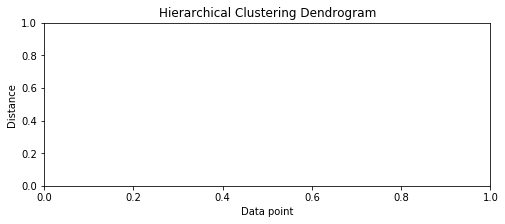

In [133]:
plt.figure(figsize=(8, 3))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data point')
plt.ylabel('Distance')
dendrogram(Z)
plt.axhline(y=0, c='k', ls='--', lw=0.9)

In [134]:
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_topics=10, max_iter=100, random_state=0)
dt_matrix = lda.fit_transform(cv_matrix)
features = pd.DataFrame(dt_matrix, columns=['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10'])
features

/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/online_lda.py:294: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/online_lda.py:536: DeprecationWarning: The default value for 'learning_method' will be changed from 'online' to 'batch' in the release 0.20. This warning was introduced in 0.18.
  DeprecationWarning)


KeyboardInterrupt: 

In [ ]:
tt_matrix = lda.components_
for topic_weights in tt_matrix:
    topic = [(token, weight) for token, weight in zip(vocab, topic_weights)]
    topic = sorted(topic, key=lambda x: -x[1])
    topic = [item for item in topic if item[1] > 30]
    print(topic)
    print()

In [ ]:

from sklearn.cluster import KMeans

km = KMeans(n_clusters=5, random_state=0)
km.fit_transform(features)
cluster_labels = km.labels_
cluster_labels = pd.DataFrame(cluster_labels, columns=['ClusterLabel'])
pd.concat([df_eng_relvant, cluster_labels], axis=1)

In [135]:
# the initial block is copied from creating_word_vectors_with_word2vec.ipynb
import nltk
from nltk import word_tokenize, sent_tokenize
import gensim
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE
import pandas as pd
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline

In [136]:
# new!
import string
from nltk.corpus import stopwords
from nltk.stem.porter import *
from gensim.models.phrases import Phraser, Phrases
from keras.preprocessing.text import one_hot

Using TensorFlow backend.


In [137]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Error loading punkt: <urlopen error [Errno 8] nodename nor
[nltk_data]     servname provided, or not known>


False

[nltk_data] Error loading stopwords: <urlopen error [Errno 8] nodename
[nltk_data]     nor servname provided, or not known>


False

In [138]:
stpwrds = stopwords.words('english') + list(string.punctuation)

In [139]:
stpwrds

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [140]:
data = [i.split()  for i in list(df_eng_relvant["comment_text"])  ] 

In [141]:
lower_sents = []
for s in data:
    print(s)
    lower_sents.append([w.lower() for w in s if w not in list(string.punctuation)])

['Hello', 'Mattihas', 'Could', 'u', 'plz', 'suggest', 'ergonomics', 'mouse']
['99%', 'of', 'the', 'mice', 'on', 'the', 'market', 'are', 'less', 'ergonomic', 'than', 'this', 'one,', 'I', 'doubt', 'this', 'is', 'the', 'one', "that'll", 'cause', 'major', 'injury.']
['this', 'video', 'deserved', 'my', 'first', 'ever', 'dislike', 'after', 'years', 'of', 'watching', 'videos', 'on', 'youtube.', 'This', 'guy', "doesn't", 'know', 'what', "he's", 'talking', 'about...', 'this', 'is', 'one', 'of', 'the', 'best', 'mice', 'for', 'productivity,', 'if', 'not', 'the', 'best.', 'Once', 'you', 'used', 'a', 'horizontal', 'scrollwheel,', 'you', 'miss', 'it', 'on', 'every', 'other', 'mouse.', "It's", 'also', 'great', 'for', 'gaming', 'even', 'though', "that's", 'not', 'its', 'intended', 'purpose.', 'Battery', 'lasts', 'about', 'a', 'month', 'with', 'my', 'use', '(extended', 'development', 'sessions)', 'and', 'it', 'charges', 'very', 'quickly.']
['I', 'use', 'my', 'mouse', 'for', 'many', 'hours', 'a', 'day',

['I', 'have', 'to', 'disagree,', 'there', "aren't", 'plenty', 'of', 'other', 'mice', 'out', 'there', 'which', 'are', 'Bluetooth', 'capable', 'and', 'which', 'work', 'reasonably', 'will.', 'I', 'use', 'a', 'Mac', 'so', 'there', 'is', 'the', 'Apple', 'Magic', 'Mouse', 'and', 'there', 'are', 'a', 'few', 'mice', 'from', 'Razer', '(which', 'are', 'even', 'more', 'expensive', 'and', "don't", 'have', 'the', 'Darkfield', 'Sensor)']
['Well,', 'I', 'think', 'the', 'upgrade', 'is', 'worth', 'depending', 'on', 'how', 'you', 'are', 'using', 'your', 'mouse', 'in', 'the', 'daily', 'basis.', 'For', 'me,', 'the', 'place', 'to', 'put', 'the', 'unified', 'receiver', 'is', 'irrelevant', 'as', 'I', 'use', 'my', 'mouse', 'on', 'my', 'desktop,', 'so', 'I', 'never', 'had', 'to', 'store', 'the', 'mouse', 'in', 'its', 'bag', '(yeah', 'the', 'anywhere', '1', 'has', 'a', 'traveler', 'bag)', 'neither', 'had', 'to', 'store', 'the', 'receiver.', 'However,', 'what', 'I', 'do', 'suffer', 'is', 'from', 'battery', 'drai

['This', 'also', 'fixed', 'my', 'MX', 'Ergo']
['Mouse', 'was', 'working', 'fine', 'for', 'over', 'a', 'year', 'with', 'updates,', 'until', 'Logitech', 'pushed', 'a', 'new', 'update', 'and', 'then', 'this', 'happened.', 'Thanks', 'so', 'much', 'for', 'this', 'quick', 'fix', 'video!!', 'Problem', 'solved', 'on', 'my', 'end,', 'mouse', 'back', 'to', 'normal.']
['Thank', 'you', 'so', 'much!', 'I', 'was', 'ready', 'to', 'buy', 'my', 'third', 'mouse', 'because', 'of', 'this', 'issue!', 'So', 'easy', 'to', 'fix.']
['omfg', 'thank', 'you', 'I', 'almost', 'threw', 'my', 'mouse', 'out', 'the', 'window', 'because', 'of', 'this!!']
['Lifesaver', 'you', 'are!', 'I', "couldn't", 'believe', 'my', 'expensive', 'mouse', 'was', 'broken', 'after', 'only', 'a', 'couple', 'of', 'months!', 'Thanks!']
['thank', 'you', 'very', 'much.', 'my', 'mx', 's2', 'is', 'working', 'scrolling']
['Did', 'Anyone', 'have', 'idea', 'or', 'solution', 'to', 'get', 'smooth', 'scroll', 'with', 'Logi', 'mouse', 'like', 'on', 'tra

['"normal', 'use"', 'so', 'not', 'a', 'gaming', 'mouse', 'eh??']
['1', 'Mouse', 'to', 'rule', 'them', 'all']
['"Performace', 'MX"', 'in', 'the', 'beginning...']
['dpi', 'way', 'to', 'low', 'for', 'me.', 'ill', 'stick', 'to', 'my', 'logi', 'Proteus', 'core']
['love', 'my', 'old', 'mx', '518', ';)', 'still', 'good', ':D']
['$100', 'on', 'Amazon,', 'a', 'bit', 'much,', 'but', 'still', 'a', 'cool', 'mouse.']
['WOW!', 'The', 'look', 'of', 'this', 'mouse', 'is', 'gorgeous!!!']
['The', 'Performace', 'MX?']
['anyone', 'with', 'claw', 'grip', 'use', 'this', 'mouse?']
['wow', 'a', 'mouse', 'was', 'never', 'this', 'interesting', 'before', 'xD']
['That', 'mouse', 'is', 'bad', 'for', 'left', 'handed', 'people', 'like', 'me', 'but', 'overall,that', 'mouse', 'looks', 'cool.', ':-)']
['No', 'smartphone', 'for', 'review?', 'No', 'matter!', "I'll", 'do', 'a', 'review', 'on', 'a', 'mouse)']
['This', 'mouse', 'is', 'perfect', 'for', 'cyber', 'wars!', 'Lol']
['Putting', 'a', 'gaming', 'mouse', 'vs', 'a', '

["I'm", 'still', 'using', 'my', 'G9X', 'Has', 'anyone', 'else', 'upgrade', 'for', 'the', 'G9X', 'to', 'the', 'MX', 'master']
['I', 'wish', 'Logitech', 'would', 'redesign', 'the', 'MX2', 'because', 'it', 'is', 'the', 'most', 'uncomfortable', 'mouse', 'i', 'have', 'ever', 'owned.', 'Logitech', 'also', 'needs', 'to', 'come', 'out', 'with', 'a', 'line', 'of', 'handheld', 'keypads', 'for', 'use', 'with', 'streaming', 'Android', 'devices.', 'Consumers', 'want', 'handhelds', 'and', "it's", 'been', 'about', '5', 'years', 'since', 'streaming', 'devices', 'started', 'appearing', 'but', 'Logitech', 'has', 'yet', 'to', 'come', 'out', 'with', 'a', 'solution', 'for', 'this', 'segment.']
['anyone', 'knows', 'what', 'Omron', 'micro', 'switches', 'are', 'inside', 'this', 'mouse?']
['i', 'saw', 'this', 'mouse', 'every', 'where', 'in', 'youtube', 'and', 'i', 'tought', 'i', "couldn't", 'by', 'it', 'for', 'my', 'birthday', 'because', 'i', 'cant', 'find', 'any', 'famous', 'mouse', 'but', 'two', 'days', 'ago

In [142]:
lower_bigram = Phraser(Phrases(lower_sents))

In [143]:
lower_bigram.phrasegrams # miss taylor, mr woodhouse, mr weston

{(b'"thumb', b'scroll"'): (6, 2244.083333333333),
 (b'(anywhere', b'1'): (6, 174.2977346278317),
 (b'1', b'year'): (11, 57.56622428075177),
 (b'10', b'dollar'): (6, 23.539335664335663),
 (b'10', b'years'): (13, 37.09228650137741),
 (b'12', b'buttons'): (7, 29.495071193866373),
 (b'1st', b'gen'): (7, 816.030303030303),
 (b'2', b'days'): (14, 30.840618438633328),
 (b'2', b'months'): (11, 23.037570399942968),
 (b'2', b'weeks'): (12, 48.49575508103936),
 (b'2', b'years'): (26, 25.350053792361486),
 (b'2', b'years.'): (12, 33.80007172314865),
 (b'3', b'different'): (7, 12.800475341651813),
 (b'3', b'months'): (8, 25.446728088825893),
 (b'3', b'years'): (20, 40.00148544266191),
 (b'4', b'years'): (16, 59.05482456140351),
 (b'40', b'days'): (7, 110.30824372759857),
 (b'5', b'years'): (19, 64.18215866530474),
 (b'6', b'months'): (8, 90.54300924628747),
 (b'6', b'years'): (8, 28.4661733615222),
 (b'7', b'years'): (8, 34.972727272727276),
 (b'70', b'days'): (8, 99.27741935483871),
 (b'70', b'dol

In [144]:
lower_bigram = Phraser(Phrases(lower_sents, min_count=32, threshold=64))
lower_bigram.phrasegrams

{(b'at', b'least'): (60, 73.31181332036947),
 (b'battery', b'life'): (77, 154.94741552920115),
 (b'left', b'handed'): (51, 122.56581626542099),
 (b'macbook', b'pro'): (42, 115.52552552552552),
 (b'scroll', b'wheel'): (185, 115.33730841906362)}

In [145]:
clean_sents = []
for s in lower_sents:
    clean_sents.append(lower_bigram[s])

In [146]:
clean_sents[6]

['this',
 'review',
 'is',
 'actually',
 'quite',
 'correct.',
 "i've",
 'been',
 'a',
 'logitech',
 'fan',
 'from',
 'as',
 'long',
 'as',
 'i',
 'can',
 'remember.',
 'and',
 'the',
 'mx',
 'master',
 'is',
 'alot',
 'less',
 'ergonomic',
 'than',
 'my',
 'previous',
 'g502,',
 'g600',
 'and',
 'g400.',
 'when',
 'i',
 'just',
 'rest',
 'my',
 'hand',
 'on',
 'the',
 'mouse',
 'for',
 'a',
 'blind',
 'starting',
 'position',
 'my',
 'index',
 'finger',
 'falls',
 'against',
 'the',
 'scrollwheel',
 'and',
 'not',
 'at',
 'all',
 'near',
 'the',
 'middle',
 'of',
 'the',
 'leftclick',
 'button',
 '(this',
 'is',
 'definitly',
 'the',
 'case',
 'on',
 'previous',
 'mice,',
 'i',
 'still',
 'have',
 'them',
 'for',
 'comparison).',
 'batterylife,',
 'precision',
 'and',
 'the',
 'overall',
 'quality',
 'is',
 '10/10',
 'but',
 'the',
 'mouse',
 'should',
 'be',
 'alot',
 'more',
 'slanted.',
 'i',
 'luckily',
 "don't",
 'have',
 'any',
 'rsi',
 'or',
 'corporal',
 'tunnel',
 'issues',
 

In [147]:
model = Word2Vec(sentences=clean_sents, size=64, sg=1, window=10, min_count=10, seed=42, workers=8)
model.save('clean_word2vec_model.w2v')

In [148]:
model = gensim.models.Word2Vec.load('clean_word2vec_model.w2v')

In [149]:
len(model.wv.vocab)

1727

In [150]:
model['battery']

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


array([ 0.47788644,  0.04296411,  0.5543195 , -0.09036212, -0.44877025,
       -0.1104517 ,  0.2175522 ,  0.08602995, -0.32888833,  0.21666929,
        0.1547465 , -0.0447908 , -0.00969438, -0.34417716, -0.16802   ,
        0.36216062, -0.1282702 , -0.29249668, -0.055802  ,  0.0026187 ,
       -0.02519111, -0.20940126,  0.00920281, -0.49487138,  0.13905644,
        0.11735829, -0.22636446,  0.21376628, -0.25357655,  0.07819654,
        0.13881952,  0.17743894, -0.07753687, -0.35552448, -0.29248527,
        0.33249807,  0.16885613,  0.00307506,  0.55117834,  0.02881507,
        0.4558861 , -0.24568301,  0.0895206 , -0.28381968,  0.19017725,
        0.04040567,  0.00416519, -0.54904455, -0.25431353, -0.08941479,
        0.26164111,  0.15122852,  0.09259968,  0.31675437,  0.37125492,
       -0.2921621 ,  0.34846938,  0.13212173,  0.20617774,  0.1046258 ,
        0.01588951,  0.08856779,  0.34150314,  0.4318037 ], dtype=float32)

In [151]:
model.most_similar('battery') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('lasts', 0.8814942240715027),
 ('aa', 0.8766196966171265),
 ('charge', 0.8422480821609497),
 ('battery,', 0.8151719570159912),
 ('life.', 0.8147839307785034),
 ('battery_life', 0.8104405999183655),
 ('removable', 0.8047718405723572),
 ('batteries', 0.8035916090011597),
 ('battery.', 0.7982803583145142),
 ('couple', 0.7852195501327515)]

In [152]:
model.most_similar('ergonomic') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('mice,', 0.923152506351471),
 ('great,', 0.9193943738937378),
 ('lighter', 0.9123236536979675),
 ('better.', 0.9111433625221252),
 ('heavy', 0.9107466340065002),
 ('market.', 0.908312976360321),
 ('imo.', 0.9082679152488708),
 ('market', 0.9047383666038513),
 ('materials', 0.9026772379875183),
 ('gamers', 0.9018217921257019)]

In [153]:
model.most_similar('noise') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('annoying', 0.968611478805542),
 ('application', 0.9605963230133057),
 ('center', 0.9574607014656067),
 ('loose', 0.9570988416671753),
 ('action', 0.9569371342658997),
 ('changes', 0.9556839466094971),
 ('clicks', 0.953302264213562),
 ('hyper', 0.9529066681861877),
 ('above', 0.9472717046737671),
 ('click,', 0.9468559622764587)]

In [154]:
model.most_similar('battery') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('lasts', 0.8814942240715027),
 ('aa', 0.8766196966171265),
 ('charge', 0.8422480821609497),
 ('battery,', 0.8151719570159912),
 ('life.', 0.8147839307785034),
 ('battery_life', 0.8104405999183655),
 ('removable', 0.8047718405723572),
 ('batteries', 0.8035916090011597),
 ('battery.', 0.7982803583145142),
 ('couple', 0.7852195501327515)]

In [155]:
model.most_similar('bluetooth') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('dongle', 0.8859456777572632),
 ('connection', 0.8682305216789246),
 ('receiver', 0.8674856424331665),
 ('unifying', 0.8642168045043945),
 ('via', 0.8630508184432983),
 ('bluetooth.', 0.8485046029090881),
 ('connected', 0.8450437784194946),
 ('connect', 0.8266397714614868),
 ('connecting', 0.8173402547836304),
 ('connectivity', 0.8032350540161133)]

In [156]:
model.most_similar('best') 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('used.', 0.8145421743392944),
 ('had.', 0.8086501955986023),
 ('ever', 0.7996234893798828),
 ('world', 0.7961314916610718),
 ('worst', 0.7535080909729004),
 ('g900', 0.7448979616165161),
 ('ever.', 0.7425301671028137),
 ('deathadder', 0.7356717586517334),
 ('spectrum', 0.7316417694091797),
 ('g502', 0.7257814407348633)]

In [157]:
model.most_similar(positive=['comfortable','mouse']) 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('comfortable,', 0.8745452761650085),
 ('aim', 0.8676270246505737),
 ('claw', 0.8647022843360901),
 ('fit', 0.8513641953468323),
 ('fits', 0.8453444242477417),
 ('great,', 0.8449926376342773),
 ('hands', 0.8441922068595886),
 ('hands.', 0.8427448272705078),
 ('uncomfortable', 0.8416444063186646),
 ('nice,', 0.8411513566970825)]

In [158]:
model.most_similar(positive=['battery','charge','batteries','charged'], negative=['removable']) 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('aa', 0.8998737335205078),
 ('lasts', 0.8886628150939941),
 ('week', 0.8862510919570923),
 ('recharge', 0.8758013844490051),
 ('year.', 0.8735322952270508),
 ('once', 0.8724421262741089),
 ('later', 0.8723453283309937),
 ('hour', 0.8713849782943726),
 ('months.', 0.870589554309845),
 ('last', 0.8689900636672974)]

In [159]:
model.most_similar(positive=['bluetooth'], negative=['computer']) 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('original', 0.3447006642818451),
 ('2s', 0.3365572690963745),
 ('master,', 0.3321843147277832),
 ('2s.', 0.3199210464954376),
 ('anywhere', 0.3154743015766144),
 ('master.', 0.29876771569252014),
 ('issues', 0.2744342088699341),
 ('new', 0.2740596532821655),
 ('black', 0.26971936225891113),
 ('exact', 0.26241937279701233)]

In [160]:
model.most_similar(positive=['ergonomics', 'comfortable'], negative=['pain']) 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('smaller', 0.7904574871063232),
 ('build', 0.7549408674240112),
 ('most', 0.7522364854812622),
 ('quite', 0.7492707967758179),
 ('ergonomic', 0.7457549571990967),
 ('good,', 0.7448286414146423),
 ('hands', 0.7401267886161804),
 ('size', 0.7386171817779541),
 ('feels', 0.7348439693450928),
 ('nice', 0.7225732803344727)]

In [161]:
model.most_similar(positive=[ 'right'], negative=['left']) 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('currently', 0.3877657651901245),
 ('mouse.', 0.32355397939682007),
 ("i'd", 0.3039151132106781),
 ('mouse', 0.2948048710823059),
 ('recommend', 0.29409879446029663),
 ('g403', 0.2911973297595978),
 ('one.', 0.2903326749801636),
 ('g602', 0.2892540991306305),
 ('ever', 0.28902989625930786),
 ('productivity', 0.28864026069641113)]

In [162]:
tsne = TSNE(n_components=2, n_iter=1000)

In [163]:
X_2d = tsne.fit_transform(model[model.wv.vocab])

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


KeyboardInterrupt: 

In [ ]:
coords_df = pd.DataFrame(X_2d, columns=['x','y'])
coords_df['token'] = model.wv.vocab.keys()

In [ ]:
coords_df.head()

In [ ]:
coords_df.to_csv('clean_word_tsne.csv', index=False)

In [164]:
coords_df = pd.read_csv('clean_word_tsne.csv')

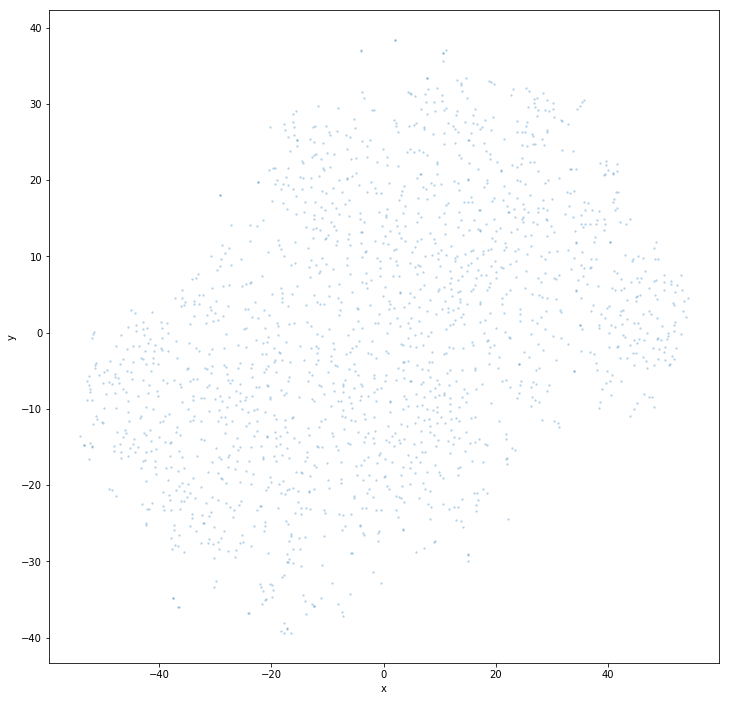

In [165]:
_ = coords_df.plot.scatter('x', 'y', figsize=(12,12), marker='.', s=10, alpha=0.2)

In [166]:
output_notebook()

Loading BokehJS ...

In [167]:
subset_df = coords_df.sample(n=100)

In [168]:
p = figure(plot_width=800, plot_height=800)
_ = p.text(x=subset_df.x, y=subset_df.y, text=subset_df.token)

In [169]:
show(p)

In [171]:
df_eng_relvant.columns

Index(['video_id', 'video_title', 'comment_author_name', 'comment_author_url',
       'comment_published', 'comment_url', 'comment_text', 'extract_date',
       'Language', 'clean_text', 'sentiment_scores_afin',
       'sentiment_category_afin', 'sentiment_scores_tb',
       'sentiment_category_tb', 'sentiment_category_vader',
       'sentiment_scores_vader', 'sentiment_scores_indicoio',
       'sentiment_scores_indicoio_hq', 'sentiment_category_indicoio',
       'sentiment_category_indicoio_hq', 'mode0', 'mode1',
       'final_sentiment_category', 'mode0', 'mode1'],
      dtype='object')

In [172]:
def keywords(category):
    return Counter(" ".join(df_eng_relvant[df_eng_relvant['final_sentiment_category'] == category]['clean_text']).split()).most_common(100)




In [173]:
from collections import Counter

for category in set(df_eng_relvant['final_sentiment_category']):
    print('category :', category)
    print('top 10 keywords:', keywords(category))
    print('---')

category : negative
top 10 keywords: [('mouse', 2266), ('not', 1362), ('mx', 821), ('logitech', 697), ('master', 508), ('like', 464), ('would', 438), ('use', 422), ('one', 394), ('mice', 357), ('scroll', 276), ('no', 266), ('button', 251), ('gaming', 241), ('really', 236), ('using', 234), ('wheel', 232), ('get', 229), ('buttons', 219), ('g', 212), ('wireless', 211), ('work', 208), ('good', 190), ('buy', 185), ('even', 185), ('new', 180), ('bluetooth', 179), ('better', 170), ('right', 168), ('much', 167), ('click', 166), ('left', 164), ('back', 161), ('problem', 161), ('used', 160), ('performance', 160), ('keyboard', 158), ('got', 153), ('still', 149), ('video', 147), ('time', 144), ('need', 144), ('battery', 142), ('make', 137), ('also', 137), ('bought', 130), ('could', 129), ('cannot', 129), ('way', 125), ('hand', 123), ('think', 123), ('great', 120), ('know', 119), ('want', 118), ('years', 117), ('side', 113), ('software', 110), ('price', 106), ('issue', 102), ('mouses', 102), ('peop

In [174]:
list(df_eng_relvant['clean_text'].map(lambda tokens: ''.join(tokens)))

['hello mattihas could u plz suggest ergonomics mouse',
 'mice market less ergonomic one doubt one thatll cause major injury',
 'video deserved first ever dislike years watching videos youtube guy not know talking one best mice productivity not best used horizontal scrollwheel miss every mouse also great gaming even though not intended purpose battery lasts month use extended development sessions charges quickly',
 'use mouse many hours day wrist hand horizontal using corsair never problem nothing vertical hand position feels natural fine want say not good position not ergonomically optimal really careful implying average user going problem get injured far ergonomic average mouse millions people use standard mice many hours day without injury',
 'warned people mouse major design flaw wheel break get stuck free wheeling mode sending mine back refund amazon not well would probably get another failure soon would hardly used mouse not fixed issue lots people happen',
 'not mouse ergonomic 

In [175]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=5, analyzer='word', ngram_range=(1, 2), stop_words='english')
vz = vectorizer.fit_transform(list(df_eng_relvant['clean_text'].map(lambda tokens: ''.join(tokens))))

vz.shape

(6279, 3536)

In [176]:
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

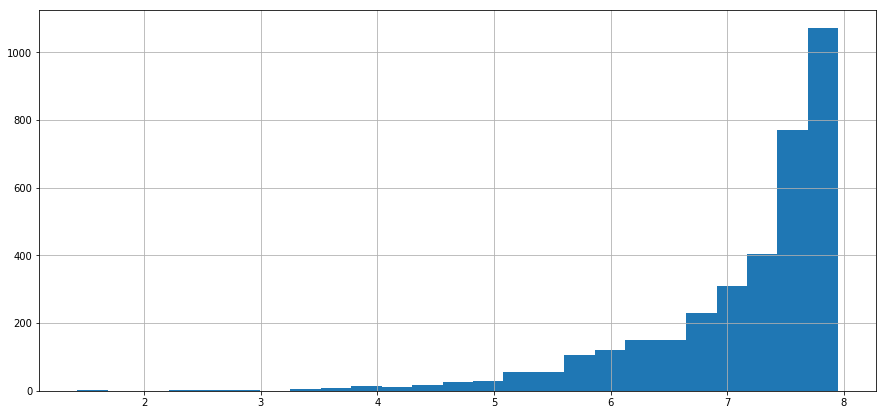

In [177]:
tfidf.tfidf.hist(bins=25, figsize=(15,7))


In [178]:
from wordcloud import WordCloud

def plot_word_cloud(terms):
    text = terms.index
    text = ' '.join(list(text))
    # lower max_font_size
    wordcloud = WordCloud(max_font_size=40).generate(text)
    plt.figure(figsize=(25, 25))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

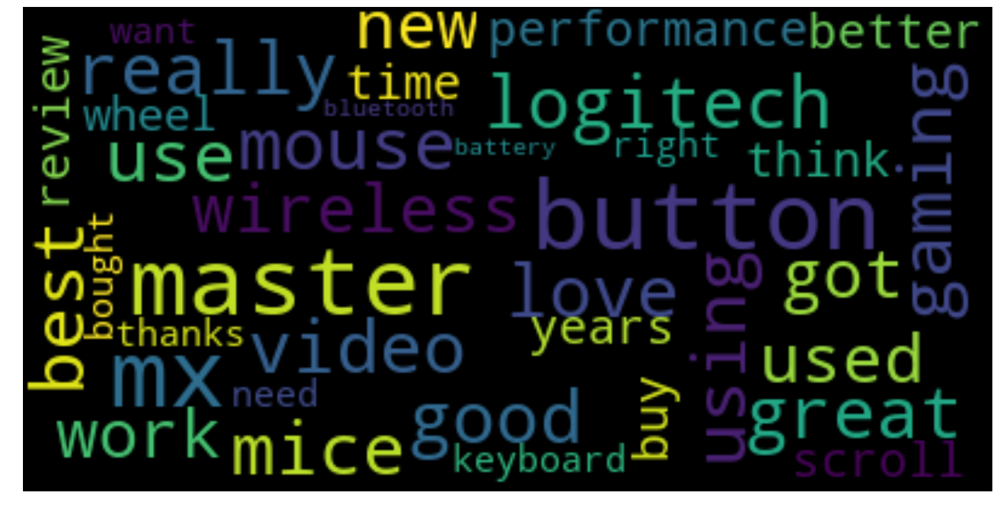

In [179]:
plot_word_cloud(tfidf.sort_values(by=['tfidf'], ascending=True).head(40))


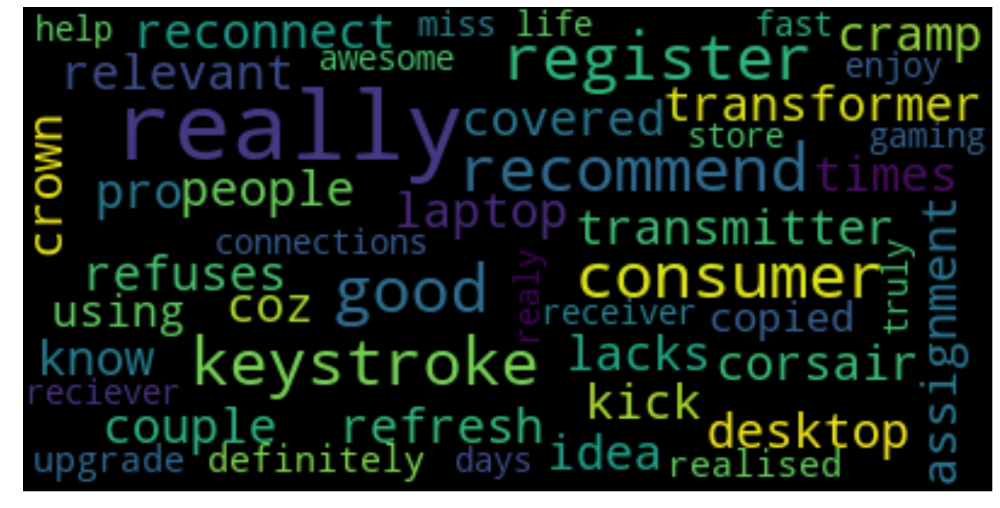

In [180]:
plot_word_cloud(tfidf.sort_values(by=['tfidf'], ascending=False).head(40))


In [181]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)

svd_tfidf.shape

(6279, 50)

In [182]:
run = True
if run:
# run this (takes times)
    from sklearn.manifold import TSNE
    tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=500)
    tsne_tfidf = tsne_model.fit_transform(svd_tfidf)
    print(tsne_tfidf.shape)
    tsne_tfidf_df = pd.DataFrame(tsne_tfidf)
    tsne_tfidf_df.columns = ['x', 'y']
    tsne_tfidf_df['category'] = df_eng_relvant['final_sentiment_category']
    tsne_tfidf_df['description'] = df_eng_relvant['clean_text']
    tsne_tfidf_df.to_csv('tsne_tfidf.csv', encoding='utf-8', index=False)
else:
# or import the dataset directly
    tsne_tfidf_df = pd.read_csv('tsne_tfidf.csv')

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6279 samples in 0.008s...
[t-SNE] Computed neighbors for 6279 samples in 3.287s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6279
[t-SNE] Computed conditional probabilities for sample 2000 / 6279
[t-SNE] Computed conditional probabilities for sample 3000 / 6279
[t-SNE] Computed conditional probabilities for sample 4000 / 6279
[t-SNE] Computed conditional probabilities for sample 5000 / 6279
[t-SNE] Computed conditional probabilities for sample 6000 / 6279
[t-SNE] Computed conditional probabilities for sample 6279 / 6279
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.815750


KeyboardInterrupt: 

In [ ]:
groups = tsne_tfidf_df.groupby('category')
fig, ax = plt.subplots(figsize=(15, 10))
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', label=name)
ax.legend()
plt.show()

In [ ]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file

In [ ]:
palette

In [ ]:
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600, title="tf-idf clustering of the youtube comments",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

palette = d3['Category10'][len(tsne_tfidf_df['category'].unique())]
color_map = bmo.CategoricalColorMapper(factors=tsne_tfidf_df['category'].map(str).unique(), palette=palette)

plot_tfidf.scatter(x='x', y='y', color={'field': 'category', 'transform': color_map}, source=tsne_tfidf_df)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"description": "@description", "category":"@category"}

show(plot_tfidf)

In [ ]:
tsne_tfidf_df.columns

In [ ]:

df_eng_relvant["length"] = df_eng_relvant.comment_text.apply(lambda x : len(x))

In [ ]:
df_eng_relvant["length"].value_counts()

In [ ]:
df_eng_relvant[df_eng_relvant.length<20]

In [183]:
import nltk.tokenize as nt
import nltk
text="Being more Pythonic is good for health."
ss=nt.sent_tokenize(text)
tokenized_sent=[nt.word_tokenize(sent) for sent in ss]

In [184]:

pos_sentences=[nltk.pos_tag(sent) for sent in tokenized_sent]
pos_sentences


[[('Being', 'VBG'),
  ('more', 'JJR'),
  ('Pythonic', 'NNP'),
  ('is', 'VBZ'),
  ('good', 'JJ'),
  ('for', 'IN'),
  ('health', 'NN'),
  ('.', '.')]]

In [278]:
def extract_NN(sent):
    grammar = r"""
    NBAR:
        # Nouns and Adjectives, terminated with Nouns
        {<NN.*>*<NN.*>}

    NP:
        {<NBAR>}
        # Above, connected with in/of/etc...
        {<NBAR><IN><NBAR>}
    """
    chunker = nltk.RegexpParser(grammar)
    ne = set()
    chunk = chunker.parse(nltk.pos_tag(nltk.word_tokenize(sent)))
    for tree in chunk.subtrees(filter=lambda t: t.label() == 'NP'):
        ne.add(' '.join([child[0] for child in tree.leaves()]))
    noun = ' '.join(str(e) for e in list(ne))
    print(noun)
    noun = remove_stopwords(noun, is_lower_case=False)
    print(noun)
    return noun
extract_NN(df_eng_relvant["comment_text"][5])


market day flaw contact MX master mouse.Way imagine btw desktop view .. world time stays mouse correctly windows hands spot palm arm people e.g direction hand scrolling button mouse price productivity screwdriver front gamer model mice bit fingers consumer choices wrist
market day flaw contact MX master mouse.Way imagine btw desktop view .. world time stays mouse correctly windows hands spot palm arm people e.g direction hand scrolling button mouse price productivity screwdriver front gamer model mice bit fingers consumer choices wrist


'market day flaw contact MX master mouse.Way imagine btw desktop view .. world time stays mouse correctly windows hands spot palm arm people e.g direction hand scrolling button mouse price productivity screwdriver front gamer model mice bit fingers consumer choices wrist'

In [275]:
df_eng_relvant["comment_text"][4]

"Be warned people, this mouse has a major design flaw with the wheel which will break and get stuck in free wheeling mode, sending mine back for a refund as Amazon don't have any more and just as well as I'd probably get another failure soon, I'd hardly used the mouse and they haven't fixed the issue, lots of people having this happen."

In [279]:
df_eng_relvant["nouns"] = df_eng_relvant["comment_text"].apply(lambda x :extract_NN(x) )

plz Hello Mattihas Could ergonomics
plz Hello Mattihas Could ergonomics
mice market injury one %
mice market injury one %
development sessions mice purpose mouse productivity years video scrollwheel videos youtube Battery guy month use
development sessions mice purpose mouse productivity years video scrollwheel videos youtube Battery guy month use
hand horizontal problem position mice mouse day hand position feels user Corsair M65 people injury millions hours wrist
hand horizontal problem position mice mouse day hand position feels user Corsair M65 people injury millions hours wrist
wheeling mode mouse issue mine failure Be refund people lots happen wheel design flaw Amazon
wheeling mode mouse issue mine failure refund people lots happen wheel design flaw Amazon
market day flaw contact MX master mouse.Way imagine btw desktop view .. world time stays mouse correctly windows hands spot palm arm people e.g direction hand scrolling button mouse price productivity screwdriver front gamer mo

Logitech Vertical mouse trackballs
Logitech Vertical mouse trackballs
MX1100 form mouse mice MX Masters
MX1100 form mouse mice MX Masters
mouse suck bluetooth money imac times waste
mouse suck bluetooth money imac times waste
hand apple mouse sulution mouse sooooooo
hand apple mouse sulution mouse sooooooo
Evoluent Vertical Mouse
Evoluent Vertical Mouse
Microsoft Sculpt mouse
Microsoft Sculpt mouse
mouse video Matthias..
mouse video Matthias ..
ages PC mouse MX
ages PC mouse MX
charm Dell standard laser mouse
charm Dell standard laser mouse
country mouse world country finger way
country mouse world country finger way
days G502 Meh..
days G502 Meh ..
MX Master sensor table looks forward end feature placement boy scroll wheel office environment sale click time refresh rate ergonomics comparison dpi G400 computers hand/better people direction sports car lines button adjustments Lightroom backward button work mouse price shame Master dpi bit Flow disappointment M720
MX Master sensor table 

K750 keyboard cause alternatives surface brand Anywhere MX brain aneurism fwd/back buttons Amazon budget mouse lack alternative product complains time months while batteries stupid problem logitech thing feels year Performance MX products button mouse ok money context menu technology weight panel settings
K750 keyboard cause alternatives surface brand Anywhere MX brain aneurism fwd/back buttons Amazon budget mouse lack alternative product complains time months batteries stupid problem logitech thing feels year Performance MX products button mouse ok money context menu technology weight panel settings
MX Master volume button model side Hope mode mapping update puttons scroll wheel mapping
MX Master volume button model side Hope mode mapping update puttons scroll wheel mapping
months Performance MX mouse Nice quality videos sub dark background .But p backup everything
months Performance MX mouse Nice quality videos sub dark background .But p backup everything
months plus laptop mouse rec

MX Master chance battery life cost corner shots video name placement year G602 gaming mouse buttons wheel vid Tomas
MX Master chance battery life cost corner shots video name placement year G602 gaming mouse buttons wheel vid Tomas
Dude apple stuff camera angles mouse shots field anything Great depth
Dude apple stuff camera angles mouse shots field anything Great depth
MX T way
MX way
MX Master Certain capability applications DI program RAT mouse shortcuts custom macro configurations choice combinations way application buttons DL settings MD
MX Master Certain capability applications DI program RAT mouse shortcuts custom macro configurations choice combinations way application buttons DL settings MD
gestures arrangement Logic zoom steps Thanks commands axises
gestures arrangement Logic zoom steps Thanks commands axises
hand volume adjustment mouse forward keyboard back buttons
hand volume adjustment mouse forward keyboard back buttons
Great Video Great mouse
Great Video Great mouse
Nice

Logitech ground bunch mine Thanks quality issues
Logitech ground bunch mine Thanks quality issues
generation people MX master MX
generation people MX master MX
computer alt none programs solutions Logitech Options mouse malfunctioning issues problem key everything screws clearance logitech Been logitech options keyboard anyone XD today mouse Gesture key dirt something Thanks headache wouldnt days fix
computer alt none programs solutions Logitech Options mouse malfunctioning issues problem key everything screws clearance logitech logitech options keyboard anyone XD today mouse Gesture key dirt something Thanks headache wouldnt days fix
lot Thanks mouse mins
lot Thanks mouse mins
button mouse cuz mouse btw thru desktops damn mac time thanks man
button mouse cuz mouse btw thru desktops damn mac time thanks man
problem Logitech i mouse replacement mouse year thanks wow tutorial
problem Logitech mouse replacement mouse year thanks wow tutorial
Thank mouse work half unstuck pointer gesture b

luck pc mouse
luck pc mouse
computer animation classes college mouse August
computer animation classes college mouse August
i pc mouse school time
pc mouse school time
Logitech flow software
Logitech flow software
mouse thing gaming things systems
mouse thing gaming things systems
razor price mouse
razor price mouse
mouse setup productivity home keyboard work use
mouse setup productivity home keyboard work use
video razor mouse lancehead Hey
video razor mouse lancehead Hey
mouse use mouse pad
mouse use mouse pad
videos mouse
videos mouse
Mouse Bordersis
Mouse Bordersis
i video editing mouse / Microsoft intellimouse stuff
video editing mouse / Microsoft intellimouse stuff
look video/photo mouse
look video/photo mouse
epic chroma mouse video
epic chroma mouse video
i mouse flow
mouse flow
mouse twitter
mouse twitter
i driver mouse kind
driver mouse kind
home mouse work
home mouse work
everyday use mouse age years videos game
everyday use mouse age years videos game
mice gaming
mice gamin

Nice video Adam mouse
Nice video Adam mouse
TIENE TECLADO HOLA PORQUE NECESITO UN TECLADO MULTIMEDIA Y ME REFIERO A MULTIMEDIA CON BOTONES ASIGNABLES Y SUBIR BAJAR VOLUMEN ETC ALGUNA SUGERENCIA EL MASTER MAUSE
TIENE TECLADO HOLA PORQUE NECESITO UN TECLADO MULTIMEDIA REFIERO MULTIMEDIA CON BOTONES ASIGNABLES SUBIR BAJAR VOLUMEN ETC ALGUNA SUGERENCIA EL MASTER MAUSE
mouse
mouse
el magic mouse
el magic mouse
MX Master sub
MX Master sub
wireless mouse i i mouse wireless mouse i computer wireless mouse wire D
wireless mouse mouse wireless mouse computer wireless mouse wire
Kinda air kind hands Logitech G502 scroll wheel scroll lock finger
Kinda air kind hands Logitech G502 scroll wheel scroll lock finger
Io ho un mouse Microsoft Confort
Io ho un mouse Microsoft Confort
😎😍 master Io ho l
😎😍 master Io ho l
wheeling mode mouse issue mine failure Be refund people lots happen wheel design flaw Amazon
wheeling mode mouse issue mine failure refund people lots happen wheel design flaw Amazon
Logite

lot mouse Man
lot mouse Man
mouse scroll wheel spin Nick anyone
mouse scroll wheel spin Nick anyone
nothing day Logitech G600 mouse years pad games brand box difference way G600 Logitech G-13 game pad game pad
nothing day Logitech G600 mouse years pad games brand box difference way G600 Logitech G-13 game pad game pad
keyboard mouse
keyboard mouse
space dollars opinion
space dollars opinion
mouse
mouse
keyboard hand mouse
keyboard hand mouse
mouse
mouse
mouse space keyboard man m gon t
mouse space keyboard man gon
Razer Naga chroma mouse
Razer Naga chroma mouse
keyboard mouse player
keyboard mouse player
mouse
mouse
i mouse Someone please WASD item joystic Question exist
mouse Someone please WASD item joystic Question exist
anyways keyboard mouse people mind controller mouse hybrid controls
anyways keyboard mouse people mind controller mouse hybrid controls
keyboard mouse PS4 Been
keyboard mouse PS4
f pyramid mouse
f pyramid mouse
mousepad dont i dont mouse pad computer
mousepad dont d

years sensitivy charm Dat mouse sensitivy OMG.. i Logitech MX518 D
years sensitivy charm Dat mouse sensitivy OMG .. Logitech MX518
problem i feet bottom logitech g502 mouse i way
problem feet bottom logitech g502 mouse way
clue people Mice
clue people Mice
g502
g502
person mouse buy buy cuz feel g502 spectrum want display gaming mouse
person mouse buy buy cuz feel g502 spectrum want display gaming mouse
mouse g502 Cooler Masters Xornet finger tip grip Logitech g402
mouse g502 Cooler Masters Xornet finger tip grip Logitech g402
Hands Logitech G502 Proteus Core mouse
Hands Logitech G502 Proteus Core mouse
MX Master G700s Master Logitech G602
MX Master G700s Master Logitech G602
mxmaster lifting grip
mxmaster lifting grip
Mionix Castor Logitech g502
Mionix Castor Logitech g502
mouse zowie list
mouse zowie list
steelseries mouse
steelseries mouse
steelseries man budget mouse
steelseries man budget mouse
MX Master PC work laptop desktop Corsair M65
MX Master PC work laptop desktop Corsair M

logitech G502 anything thing cord
logitech G502 anything thing cord
MX Master list D
MX Master list
i hand mice left mouse friends
hand mice left mouse friends
nome mice recommendation series side thumb javelin buttons scroll wheel button placement wow mouse anyone
nome mice recommendation series side thumb javelin buttons scroll wheel button placement wow mouse anyone
MX Master DPI control G602 buttons sake
MX Master DPI control G602 buttons sake
i bf4 mouse D
bf4 mouse
problem Hey Waj games -Mionix Castor -Logitech g502 -Corsair idea choices RGB Rival Deathadder
problem Hey Waj games -Mionix Castor -Logitech g502 -Corsair idea choices RGB Rival Deathadder
performance mx i SATAN country ~120 60-70 ill battery material master REALLY IMPOSSIBLE batteries comfy g700s cable mouse mounts PURE EVIL MAN WHO JUST DESTROYED HIS MOUSE price days WORST mice EVER
performance mx SATAN country ~120 60-70 ill battery material master REALLY IMPOSSIBLE batteries comfy g700s cable mouse mounts PURE EVI

MX Master Wireless Mice AA Batteries MX Series Vertical Mouse size time Logitech user Logitech Wireless Gaming F710 controller Performance M705 needs Single AA Battery Performance MX Pc Internal battery AA NiMh battery hand mouse wider mouse MX Series Mice A MX Series wireless Track Ball downgrade
MX Master Wireless Mice AA Batteries MX Series Vertical Mouse size time Logitech user Logitech Wireless Gaming F710 controller Performance M705 needs Single AA Battery Performance MX Pc Internal battery AA NiMh battery hand mouse wider mouse MX Series Mice MX Series wireless Track Ball downgrade
MX Master mine dies driver laptop windows/browsers/spreadsheets PMX MXM years review ergonomics USB port Bluetooth connection Thanks work Performance MX day use
MX Master mine dies driver laptop windows/browsers/spreadsheets PMX MXM years review ergonomics USB port Bluetooth connection Thanks work Performance MX day use
razer death adder master mice mouse mx master devices year Ive purchase thing trac

that.hmm
that.hmm
i performance mx mouse Rainbow work days pupg school someone stole siege everything
performance mx mouse Rainbow work days pupg school someone stole siege everything
problem Logitech Logitech software problems experience jumping MX Master mouse
problem Logitech Logitech software problems experience jumping MX Master mouse
MX Revo MX
MX Revo MX
days wireless mouse battery life months
days wireless mouse battery life months
Performance MX ages
Performance MX ages
MX1100
MX1100
people mouse
people mouse
home years MX master work
home years MX master work
MX Master thanks Flow Linus Tech Tips Anywhere software piece functionality Synergy
MX Master thanks Flow Linus Tech Tips Anywhere software piece functionality Synergy
Best mouse
Best mouse
mx revolution garbage
mx revolution garbage
Thank mouse one
Thank mouse one
gaming functions mouse
gaming functions mouse
comfort mouse HP i Ok
comfort mouse HP Ok
i mouse day
mouse day
Logitech MX Does anyone
Logitech MX anyone
fwd/b

.. mouse memes hmm
.. mouse memes hmm
king mouse
king mouse
design mouse
design mouse
bluetooth dongle £130.80 neaah Mouse Nice
bluetooth dongle £ 130.80 neaah Mouse Nice
position left click buttons click button mouse tilt NOT wait locking mechanism THE PRICE TAG
position left click buttons click button mouse tilt NOT wait locking mechanism PRICE TAG
ANY gaming mouse
gaming mouse
magic mouse people mouse Apple fanboys
magic mouse people mouse Apple fanboys
mouse
mouse
Anker mouse
Anker mouse
mouse review LMFBO Yo D
mouse review LMFBO Yo
market precision experience life scroll environment use somebody right-click buttons time comfort perspective options nothing ton F5 DPI price-range lot angle keys button mouse performance side left-click customization fingers double-click
market precision experience life scroll environment use somebody right-click buttons time comfort perspective options nothing ton F5 DPI price-range lot angle keys button mouse performance side left-click customizatio

mx master dollars keyboard EXPENSIVE BECAUSE ITS NOT SO EXPENSIVE THAN THE UNIMOUSE
mx master dollars keyboard EXPENSIVE NOT EXPENSIVE UNIMOUSE
Double click mouse Glad video work
Double click mouse Glad video work
mouse Moose Wow
mouse Moose Wow
unimouse rgb lighting
unimouse rgb lighting
mouse
mouse
DBPOWER USB2.0 wireless finger mouse time trackball
DBPOWER USB2.0 wireless finger mouse time trackball
dollar mouse
dollar mouse
mouse
mouse
apple mouse comment 😂😂😂😂
apple mouse comment 😂😂😂😂
god O mouse
god mouse
dongle > mouse
dongle > mouse
mouse
mouse
SpaceMouse Wireless support macros G602 Gaming Mouse profiles Mouse = Winning
SpaceMouse Wireless support macros G602 Gaming Mouse profiles Mouse = Winning
something mouse
something mouse
mouse wan
mouse wan
Logitech mice
Logitech mice
RGB master race
RGB master race
lefties accommodate
lefties accommodate
mouse
mouse
Perfect mouse adjustments
Perfect mouse adjustments
i mouse
mouse
words EVERY MOUSE click
words EVERY MOUSE click
Logitech

programs Lenovo mice Logitech mice switches Sooner double-click work HP Microsoft click
programs Lenovo mice Logitech mice switches Sooner double-click work HP Microsoft click
windows stuff program mac Linux Logitech mouse 😁😁😁😁
windows stuff program mac Linux Logitech mouse 😁😁😁😁
mouse program download features 'flow ripoff
mouse program download features ' flow ripoff
i regards mice P nothing Roccat Nyth bluetooth needs fan blouetooth synergy desktop computer
regards mice P nothing Roccat Nyth bluetooth needs fan blouetooth synergy desktop computer
mouse reason Logi tec logo mind sense sound Lew
mouse reason Logi tec logo mind sense sound Lew
mouse thumb rest forward shape weakness size gaming mouse back buttons
mouse thumb rest forward shape weakness size gaming mouse back buttons
share mouse feature clipboard LAN windows thing mac Mouse garage computers thing pasteasy borders anyone
share mouse feature clipboard LAN windows thing mac Mouse garage computers thing pasteasy borders anyo

razer mambas AUD tile floor Razer right mouse button
razer mambas AUD tile floor Razer right mouse button
MX Master master ftw
MX Master master ftw
master battery life reason mx master flow ther
master battery life reason mx master flow ther
pc go + laptop mx master class windows flow home
pc go + laptop mx master class windows flow home
sense wireless mouse work
sense wireless mouse work
master please razer basilisk
master please razer basilisk
master Razer mouse razer mouse video
master Razer mouse razer mouse video
MX Master day shipping mouse BOOoOOoOOoOOOmmMmmMm balcony
MX Master day shipping mouse BOOoOOoOOoOOOmmMmmMm balcony
button mouse version cut tool/blade tool day minutes scroll wheel FCPX user
button mouse version cut tool/blade tool day minutes scroll wheel FCPX user
software mouse program
software mouse program
reasons i mouse video logitech app thumb wheel timeline idea Hey thanks vid
reasons mouse video logitech app thumb wheel timeline idea Hey thanks vid
batons copy/

mice difference FLOW
mice difference FLOW
MX Master laptop mouse file ability desktop station thing feel computer difference grips work station files software time network paste
MX Master laptop mouse file ability desktop station thing feel computer difference grips work station files software time network paste
MX Master mice paste files mouse pc feature looks American Amazon price flow copy video computers mac mouses difference Australia
MX Master mice paste files mouse pc feature looks American Amazon price flow copy video computers mac mouses difference Australia
feature flow Sorry apparent video comprehensive ie deal number opinion comments MX master Hey way answer people questions Thanks means %
feature flow Sorry apparent video comprehensive ie deal number opinion comments MX master Hey way answer people questions Thanks means %
cool mouse
cool mouse
mouse..in options studio sir debug
mouse .. options studio sir debug
YouTube mice mouse ergonomics YouTube mouse.. thumb scrolls h

[ SOLVED ] issue preferences Selector Button video bluetooth preferences steps Press gots fine dongle retina Click wait SOLUTION while wifi router Connect weeks pairing BT button mouse today mx master pressing Wifi
[ SOLVED ] issue preferences Selector Button video bluetooth preferences steps Press gots fine dongle retina Click wait SOLUTION wifi router Connect weeks pairing BT button mouse today mx master pressing Wifi
scrolling mouse shift button years keyboard Did something yesterday
scrolling mouse shift button years keyboard something yesterday
problem i adjustment mouse side windows thing behaviour dpi flick it* screen software gamers lot settings monitors wrist
problem adjustment mouse side windows thing behaviour dpi flick it* screen software gamers lot settings monitors wrist
mouse computer application buttons time
mouse computer application buttons time
i scrolling mouse scroll wheels games browsers
scrolling mouse scroll wheels games browsers
scrolling zzz mouse badass lol w

darkfield ring
darkfield ring
Alupad Mouse Pad
Alupad Mouse Pad
life mouse
life mouse
mouse today Mac feet review
mouse today Mac feet review
i mice mx ergo mouse performance mx revolution thing i god razer mamba ergonomics grade tracking lot
mice mx ergo mouse performance mx revolution thing god razer mamba ergonomics grade tracking lot
mice use USB weight mice battery
mice use USB weight mice battery
mouse pad kind
mouse pad kind
Great Review Mice NOT Mouses
Great Review Mice NOT Mouses
i day logitech logitech g700 battery
day logitech logitech g700 battery
transmitter Logitech products symbol
transmitter Logitech products symbol
M705 mouse dream batteries
M705 mouse dream batteries
replacement Logitech Anywhere Mouse battery
replacement Logitech Anywhere Mouse battery
BT connectivity mouse Logitech MX5500 MX Revolution cinilaknedalm
BT connectivity mouse Logitech MX5500 MX Revolution cinilaknedalm
mice replacement Apple Magic Mouse hand position MM
mice replacement Apple Magic Mouse

tap issue gestures feel work scroll CAD work Mac OS integration Mac OS extension windows programs cover platform functions school grip style problems glass feel benefit bootcamp windows metal engineering task party software computers MacBook Pro files VPN mouse advantage Magic Mouse browsing second-hand school work combinations
tap issue gestures feel work scroll CAD work Mac OS integration Mac OS extension windows programs cover platform functions school grip style problems glass feel benefit bootcamp windows metal engineering task party software computers MacBook Pro files VPN mouse advantage Magic Mouse browsing second-hand school work combinations
mouse Apple Love Apple hardware MX Master S2 keyboard Magic Mouse work workhorse mouse
mouse Apple Love Apple hardware MX Master S2 keyboard Magic Mouse work workhorse mouse
wire mouse
wire mouse
= sensitivity surface anything notebook Man My Apple mouse
= sensitivity surface anything notebook Man Apple mouse
MX Master magic mouse years t

Logitech Marble Mouse office work trackball
Logitech Marble Mouse office work trackball
safety thing RSI health mouse
safety thing RSI health mouse
mouse scroll actuators issues power engineers
mouse scroll actuators issues power engineers
Damn people hipster mouses
Damn people hipster mouses
law mice job mother thinking wrist
law mice job mother thinking wrist
mouse day price stiff/shoulder pain Are
mouse day price stiff/shoulder pain
mouse Logitech g602
mouse Logitech g602
mouse issue Mx2s Does anybody battery
mouse issue Mx2s anybody battery
programs things games scroll wheel buttons times middle home mouse Mx master someminda case course budget mice Hyper scroll switch button side scroll quality lot rubber button mouse dpi kind dpi
programs things games scroll wheel buttons times middle home mouse Mx master someminda case course budget mice Hyper scroll switch button side scroll quality lot rubber button mouse dpi kind dpi
HardwareCanucks mouse
HardwareCanucks mouse
trackball mouse

Logitech G502 mouse
Logitech G502 mouse
Performance MX
Performance MX
performance mx mx master
performance mx mx master
performance mx Lol
performance mx Lol
Performance MX gaming mouse
Performance MX gaming mouse
razer Deathadder mouse
razer Deathadder mouse
AM title mouse awareness Thanks house
title mouse awareness Thanks house
mouse MKBHD
mouse MKBHD
weeks lol i mx mouse
weeks lol mx mouse
mx master video
mx master video
austin mouse
austin mouse
night title house
night title house
mx revolution
mx revolution
games thing lol scroll wheel input lag Performance mouse mx
games thing lol scroll wheel input lag Performance mouse mx
mouse ball
mouse ball
Razer DeathAdder mouse
Razer DeathAdder mouse
wireless mouse Nope
wireless mouse Nope
Performance MX
Performance MX
mouse performance
mouse performance
AmazonBasics mouse
AmazonBasics mouse
reason mouse
reason mouse
months MX Master launches
months MX Master launches
mouse Mx Performance TOP
mouse Mx Performance TOP
Awesome mouse
Awesome

button mouse mouse setup videos type animator
button mouse mouse setup videos type animator
choice mx masters
choice mx masters
LOGITECH brand bro Bro LOGITECH x50 difference x100 Bluetooth speaker buy cost one
LOGITECH brand bro Bro LOGITECH x50 difference x100 Bluetooth speaker buy cost one
mouse budget wise cheppu wireless keyboard Anna
mouse budget wise cheppu wireless keyboard Anna
Logitech keyboard Anna
Logitech keyboard Anna
opinion cheptara bro Logitech m235 wireless
opinion cheptara bro Logitech m235 wireless
mouse alage mouse gurichi review chastara Galla difference kuda chepade..plzz sir
mouse alage mouse gurichi review chastara Galla difference kuda chepade .. plzz sir
mouse review evandi students.. Plzzz Anna
mouse review evandi students .. Plzzz Anna
bro mouse chepandi.. lo
bro mouse chepandi .. lo
mouse toys money reweiws zoom h1 itens
mouse toys money reweiws zoom h1 itens
KNOW giveaway MOUSES LOL Comment MICE
KNOW giveaway MOUSES LOL Comment MICE
animal computer hardwa

Mouse Great Video Logitech mice ergonomics
Mouse Great Video Logitech mice ergonomics
MX Master Great review
MX Master Great review
MX Master productivity usage Nice review
MX Master productivity usage Nice review
MX Master life
MX Master life
graphite cleanest hypebeast mousepad
graphite cleanest hypebeast mousepad
MX master mouse
MX master mouse
dollars MX master
dollars MX master
master want
master want
MX Master Mice
MX Master Mice
MX
MX
months Windows app product January battery Best mouse
months Windows app product January battery Best mouse
MX Master Justin video
MX Master Justin video
mx master
mx master
mouse
mouse
Logitech wireless mice years life performance
Logitech wireless mice years life performance
G name D
G name
MX Master bag desk time
MX Master bag desk time
days battery Logitech mouse budget option smooth ratchet scrolling
days battery Logitech mouse budget option smooth ratchet scrolling
laptop mouse
laptop mouse
Mx Master
Mx Master
plus battery life mouse forth bu

mouse performance outlooking UNSUBSCRIBED result DPI video ADVERTISEMENT gamer mouses car laser type knowledge acceleration way Almost people world
mouse performance outlooking UNSUBSCRIBED result DPI video ADVERTISEMENT gamer mouses car laser type knowledge acceleration way Almost people world
Logitech video g502 mouse
Logitech video g502 mouse
mouse
mouse
headshots thing mouse
headshots thing mouse
devices mouse
devices mouse
bux Got mouse pawn shop
bux Got mouse pawn shop
hover mouse
hover mouse
day trash days guys MX Anywhere ] MXs feeling material A4tech V7m work nothing Razer mice plastic thing [ trackpad tbh man components way clicks Logitech garbage browsing iteration
day trash days guys MX Anywhere ] MXs feeling material A4tech V7m work nothing Razer mice plastic thing [ trackpad tbh man components way clicks Logitech garbage browsing iteration
driver day left corner years DR car teammates Lycosa screen surprise jitter issues MMO LAN party minutes buy Came copperhead closer Ra

i mouse years mouse i pc/laptop use
mouse years mouse pc/laptop use
button mouse Firepower Zelotes T-60 Gaming Mouse succession times
button mouse Firepower Zelotes T-60 Gaming Mouse succession times
xD i mouse Asus Spatha
xD mouse Asus Spatha
while complaint software driver version Logitech Options thing product feel responsiveness button.. My
complaint software driver version Logitech Options thing product feel responsiveness button ..
version G300S Logitech G300 job standard
version G300S Logitech G300 job standard
Mouse Bluetooth = Slower Response World
Mouse Bluetooth = Slower Response World
logitech proteus spectrum g502
logitech proteus spectrum g502
mouse Razer DeathAdder Pro McFly Whateverthehellotherrazermemesare
mouse Razer DeathAdder Pro McFly Whateverthehellotherrazermemesare
support mouse nothing Sentey Lumenata Pro
support mouse nothing Sentey Lumenata Pro
Logitech mouse Logitech G502 Proteus Core G502 video Razer Deathadder Chroma Razer Ouroboros plan
Logitech mouse Log

wireless mouse Oh
wireless mouse Oh
mouse
mouse
Messes mouse mouses man plural
Messes mouse mouses man plural
Ouroboros MX
Ouroboros MX
school mouse Dafuq
school mouse Dafuq
hover mouse
hover mouse
Logitech Proteus core g502 mouse
Logitech Proteus core g502 mouse
mouse D
mouse
MX Master side scroll wheel features M720 Triathlon lot
MX Master side scroll wheel features M720 Triathlon lot
Way years shoulder M570 hands MX Ergo MX master people yesterday discomfort wrist
Way years shoulder M570 hands MX Ergo MX master people yesterday discomfort wrist
mice mouse
mice mouse
i today years trackball mouse Microsoft trackball mouse love
today years trackball mouse Microsoft trackball mouse love
mac trackpad desktops ergo mouses investment elbow application window right motions Roll order windows ball button settings instance MX Ergo Plus Logitech keyboard level Window Management screen mouse productivity Browser window FN key wrist
mac trackpad desktops ergo mouses investment elbow application

functionality.. tbh.. form.. experience dial use.. price range.. higer profits.. copy standalone dial boundaries thing feels price tag keyboard preference way piece people lot suits kind hardware someone
functionality .. tbh .. form .. experience dial use .. price range .. higer profits .. copy standalone dial boundaries thing feels price tag keyboard preference way piece people lot suits kind hardware someone
solution Q mouse selections adjustments Alt-Tab applications pain thing keyboard Thanks key butt dial discreet positions wheel function keys
solution Q mouse selections adjustments Alt-Tab applications pain thing keyboard Thanks key butt dial discreet positions wheel function keys
week battery life wireless Hard year AA batteries keyboard Are battery crisp keystrokes pass people time
week battery life wireless Hard year AA batteries keyboard battery crisp keystrokes pass people time
knob Logi Craft price imo customisation programs imo functionalities menu bottom price tag keyboar

mouse windows keyboard bit default
mouse windows keyboard bit default
zoom feature Premiere mouse timeline
zoom feature Premiere mouse timeline
junk suff price tag youtube reviewer keyboard lots Personally Logitech peripherals
junk suff price tag youtube reviewer keyboard lots Personally Logitech peripherals
Logitech rog claymore lol yeet plastic meme keyboard backlighting k95 Platinum
Logitech rog claymore lol yeet plastic meme keyboard backlighting k95 Platinum
week taxes Canada pre-order notification email.The Logitech Craft keyboard Ontario
week taxes Canada pre-order notification email.The Logitech Craft keyboard Ontario
keyboard Mx master
keyboard Mx master
.Pianisto keyboardisto Dmitry CoolerMaster message
.Pianisto keyboardisto Dmitry CoolerMaster message
applications video shortcuts pointless Idk things Mouse use
applications video shortcuts pointless Idk things Mouse use
ads keyboard =.= guts cooler master keyboard others Bro
ads keyboard =.= guts cooler master keyboard other

box mouse mouse round battery weeks way juice
box mouse mouse round battery weeks way juice
problem i scrolling button mouse version whitch scroll wheel MX master hyperfast scrolling MX nope click edition
problem scrolling button mouse version whitch scroll wheel MX master hyperfast scrolling MX nope click edition
style mice G502 games contact videos controls Woah @ JimsReviewRoom mention gamers
style mice G502 games contact videos controls Woah @ JimsReviewRoom mention gamers
mouse money precision movement review boy Thanks investment trick desk space
mouse money precision movement review boy Thanks investment trick desk space
sensor i master mouse mx master mx something Hi jim motor function hyper scroll scroll wheel
sensor master mouse mx master mx something Hi jim motor function hyper scroll scroll wheel
staples coupon brainer mx series
staples coupon brainer mx series
razer orochi mode gaming mouse
razer orochi mode gaming mouse
software mouse
software mouse
apple mouse mouse MacB

setup ones speakers Wow Logitech peripherals
setup ones speakers Wow Logitech peripherals
style logitech lights possiblity upgrade ones boi i speakers cuz people sound logitech speakers
style logitech lights possiblity upgrade ones boi speakers cuz people sound logitech speakers
volume fixes killer volume control way firmware update Way sound
volume fixes killer volume control way firmware update Way sound
i thanks Harman Kardon Soundsticks III Harman Kardon Soundsticks part speaker sounds Vs Logitech G560 Logitech G560
thanks Harman Kardon Soundsticks III Harman Kardon Soundsticks part speaker sounds Vs Logitech G560 Logitech G560
layout Logitech fan product ecosystem gaming keyboards crap keycaps
layout Logitech fan product ecosystem gaming keyboards crap keycaps
Logitech speakers Z623 THX
Logitech speakers Z623 THX
Logitech Speaker Market
Logitech Speaker Market
Inspire speaker setup G19 keyboard logitech G502 mouse Digital logitech components
Inspire speaker setup G19 keyboard logi

MX Master Logitech MX Revolution mouse eBay MX Revolution decade Amazon
MX Master Logitech MX Revolution mouse eBay MX Revolution decade Amazon
till i oneplus bluetooth tv mhl games surface profile
till oneplus bluetooth tv mhl games surface profile
MX Master laptops mouse Logitech MX Thank years improvements video idea
MX Master laptops mouse Logitech MX Thank years improvements video idea
Windows laptop lot dongle devices i7 desktop mouse home functionality
Windows laptop lot dongle devices i7 desktop mouse home functionality
i video work left click button mouse Master MX age amazon today years interruptions alot mouse i editing Performance MX issues
video work left click button mouse Master MX age amazon today years interruptions alot mouse editing Performance MX issues
MX Master dongle i Bluetooth mouses connection issues lag issues
MX Master dongle Bluetooth mouses connection issues lag issues
sensor Logitech company mouse thing products shitty sensor work Edit I`m display resolut

Mad Catz R.A.T mouse it.. tho D
Mad Catz R.A.T mouse .. tho
G700s Logitech mouses Looks
G700s Logitech mouses Looks
Hey Marques mice Madcatz Rat series
Hey Marques mice Madcatz Rat series
performance mx
performance mx
mice Roccat mice feature design example lot
mice Roccat mice feature design example lot
software provide mouse Mac video features Hey Marques software anyone
software provide mouse Mac video features Hey Marques software anyone
performance mx lag machine /pass
performance mx lag machine / pass
gestures arch Magic mouse top
gestures arch Magic mouse top
laptop Ok mouse function i Fn key
laptop Ok mouse function Fn key
IMO mouse SetPoint Logitech Options crap feels mouse work user build quality MX Revolution/M950
IMO mouse SetPoint Logitech Options crap feels mouse work user build quality MX Revolution/M950
comfort aspect gaming mouse work
comfort aspect gaming mouse work
beter century magic
beter century magic
mouse video cyborg R.A.T
mouse video cyborg R.A.T
fire Im mouse

Logitech wave pro mouse LOGITECH ATMOSPHERE half MX mouse decade keyboard buttons buttons level.. multi tasking WIN Photoshop
Logitech wave pro mouse LOGITECH ATMOSPHERE half MX mouse decade keyboard buttons buttons level .. multi tasking WIN Photoshop
mouse humor sir Great video wireless guy keyboard Hahah
mouse humor sir Great video wireless guy keyboard Hahah
Damn mouse yesterday
Damn mouse yesterday
Epidemic Sounds🎧 mice Great choice mines MX Masters
Epidemic Sounds🎧 mice Great choice mines MX Masters
bedroom TV.. drop master bedroom RANGE Travis rooms studder board My custom PC/Gaming/workstation connection work way *I living room TV bedroom apartment
bedroom TV .. drop master bedroom RANGE Travis rooms studder board custom PC/Gaming/workstation connection work way *I living room TV bedroom apartment
Mouse Rules
Mouse Rules
keys Roccat ones Went mice years Mouse clicking bugmonsters
keys Roccat ones Went mice years Mouse clicking bugmonsters
MX Master months mouse % correct everyt

dude i someone please mouse pad
dude someone please mouse pad
NOBODY everybody comments mouse
NOBODY everybody comments mouse
Sorry point tech mouse
Sorry point tech mouse
c thing mouse
c thing mouse
reason None C mouse
reason None C mouse
hehe mx master device
hehe mx master device
gen rgb speeds cheero Sigh yours issues battery pack Samsung cable phone Huawai Nexus USB-3.1 mAh tech times charges machine USB-2.0 thing form factor fraction rate pent cable cent chargers Logitech mouse USB-3.0 default USB-C connector charges Assholes testing speed G900 half mention MUCH one
gen rgb speeds cheero Sigh issues battery pack Samsung cable phone Huawai Nexus USB-3.1 mAh tech times charges machine USB-2.0 thing form factor fraction rate pent cable cent chargers Logitech mouse USB-3.0 default USB-C connector charges Assholes testing speed G900 half mention MUCH one
USA Link http Mouse International Logitech MX Master Amazon
USA Link http Mouse International Logitech MX Master Amazon
i dollar mou

MX Master witch Logitech Marathon Mouse M705 MX fersure
MX Master witch Logitech Marathon Mouse M705 MX fersure
mouse imo hand years milion buttons £ perfect Never simple x3300 wireless mouse
mouse imo hand years milion buttons £ perfect Never simple x3300 wireless mouse
FPS games Logitech mouse right mouse button year view half gon anything mouse button RM button scope mode refund time
FPS games Logitech mouse right mouse button year view half gon anything mouse button RM button scope mode refund time
Bought MX master MX performance.. buttons ergonomics
Bought MX master MX performance .. buttons ergonomics
home use PC MX Masters Work use things G900 Chaos Spectrum gaming mouse
home use PC MX Masters Work use things G900 Chaos Spectrum gaming mouse
while mouse thing works Nah one
mouse thing works Nah one
max mouse computers Flat Mouse functionality
max mouse computers Flat Mouse functionality
keyboard time mouse
keyboard time mouse
laptop mouse monitor setup keyboard Wireless stuff mo

MX Master nothing
MX Master nothing
tmz imac mouse Clueless guy
tmz imac mouse Clueless guy
lol mouse
lol mouse
MX Master PC lot
MX Master PC lot
mice mouse
mice mouse
bucks mouse
bucks mouse
MX master logitech G602
MX master logitech G602
buttons mouse pc..
buttons mouse pc ..
Logitech G502
Logitech G502
i mouse
mouse
water lighting mouse system.kinda
water lighting mouse system.kinda
types software mice mouse programming
types software mice mouse programming
i logitech g19 mx master yesterday miles way i
logitech g19 mx master yesterday miles way
wth guys dollar mouse
wth guys dollar mouse
wtf basics
wtf basics
country mouse
country mouse
i TeamLewAndTom mx master TeamLew dollar mice asthetics qaulity mice
TeamLewAndTom mx master TeamLew dollar mice asthetics qaulity mice
Razer Mouse XD Im
Razer Mouse XD Im
money mouse teamtom
money mouse teamtom
Cheapness years £3 mouse win
Cheapness years £ 3 mouse win
Mice
Mice
steel series mouse mouse
steel series mouse mouse
mouse backpack light

productivity / gestures Windows mice surface Magic Mouse Logitech MX Master
productivity / gestures Windows mice surface Magic Mouse Logitech MX Master
sculpt JEtech mouse haha didnt
sculpt JEtech mouse haha didnt
sensor question mice mouse surface mouse etc videos Razer Deathadder things delay Which Dave Deathadder
sensor question mice mouse surface mouse etc videos Razer Deathadder things delay Dave Deathadder
m705 M
m705
mouse issue dongle tons mx620 Feels buttons
mouse issue dongle tons mx620 Feels buttons
mouse clicks I´d
mouse clicks I´d
IDK Mac MS Sculpt Comfort mouse ones Magic Mouse gaming functions work way lot
IDK Mac MS Sculpt Comfort mouse ones Magic Mouse gaming functions work way lot
mice mouse dongle Bluetooth energy stores
mice mouse dongle Bluetooth energy stores
exception file transfer mouse mice
exception file transfer mouse mice
Windows mouse time saver F*** NO 😂 gestures years ergonomics OSX Magic Mouse software
Windows mouse time saver F*** NO 😂 gestures years er

batteries life M Logitech mouse option mouse surface screen grip lot surface coverage batery life Logitech MX Anywhere comfort i
batteries life Logitech mouse option mouse surface screen grip lot surface coverage batery life Logitech MX Anywhere comfort
i sucks windows scrollin video dell advice mouses Magic mouse Does anyone
sucks windows scrollin video dell advice mouses Magic mouse anyone
MX Master side price DPI USB year Logitech Marathon Mouse M705 bucks scroll wheel tank battery buttons wireless mouse place lag %
MX Master side price DPI USB year Logitech Marathon Mouse M705 bucks scroll wheel tank battery buttons wireless mouse place lag %
Hi logitech gesture
Hi logitech gesture
Dell XPS driver options mouse Cool vid
Dell XPS driver options mouse Cool vid
i mice alike series content fan wireless/bluetooth mouse review mx something job work trouble arc touch presentations management schools
mice alike series content fan wireless/bluetooth mouse review mx something job work troubl

glass thanks mouse pad MX ANYWHERE Darkfield sensor
glass thanks mouse pad MX ANYWHERE Darkfield sensor
backing type mousepad
backing type mousepad
G903 master race wireless mouse
G903 master race wireless mouse
Apple mouse Very Dave
Apple mouse Dave
problem macs Macs get Bluetooth connection Logi mouse time sleep
problem macs Macs get Bluetooth connection Logi mouse time sleep
replacement thinking g602 mx master
replacement thinking g602 mx master
i mobile mobile. thing Pls way Hai dave.. Which wireless mouse coz im planing
mobile mobile. thing Pls way Hai dave .. wireless mouse coz im planing
Awesome Cool Video wireless mouse Thanks Hey
Awesome Cool Video wireless mouse Thanks Hey
look mice cause
look mice cause
question laptop bluetooth mouse battery
question laptop bluetooth mouse battery
price review functionality cheers HP Z3700 look mouses Hey rate
price review functionality cheers HP Z3700 look mouses Hey rate
advance James Donkey Wireless Gaming Mouse Thanks
advance James Donk

school computer mice
school computer mice
trackball Microsoft trackball mouse stick age touch screen school weapon sort children drive car screen wireless mouse
trackball Microsoft trackball mouse stick age touch screen school weapon sort children drive car screen wireless mouse
holder Logitech MX Ergo purchase Dennis
holder Logitech MX Ergo purchase Dennis
logitech trackball gaming mouse
logitech trackball gaming mouse
logitech m520
logitech m520
pun Logitech fan thumb trackball design
pun Logitech fan thumb trackball design
ball mouse mouse
ball mouse mouse
sensitivity video editing hand trackball mouse day mice thumb haha BUT thing ball grip strength monitor setup acceleration game work point wrist
sensitivity video editing hand trackball mouse day mice thumb haha thing ball grip strength monitor setup acceleration game work point wrist
person mouse Trackball mice years ELECOM M-XT3DRBK
person mouse Trackball mice years ELECOM M-XT3DRBK
RGB trackball mouse
RGB trackball mouse
mice
m

gunk pair control movements axis games discs resolution while appeal result ball ball mouse wheel mouse way point trackball mouse step reason flick
gunk pair control movements axis games discs resolution appeal result ball ball mouse wheel mouse way point trackball mouse step reason flick
driver mouse thing M570 G603 CSGO month comfy use
driver mouse thing M570 G603 CSGO month comfy use
middle trackball mouse version Unreal Tournament III speed Him D use precision thing ball Beauty belkins targets trackball mouse hell time players D
middle trackball mouse version Unreal Tournament III speed use precision thing ball Beauty belkins targets trackball mouse hell time players
laptops mouse program PLC surface trackpad service
laptops mouse program PLC surface trackpad service
trackball years mouse Quake butt btw video LAN parties
trackball years mouse Quake butt btw video LAN parties
while muscles problems mouse thumb stress strain trackball mouse wrist
muscles problems mouse thumb stress s

mouse 😀 Arumai Nanba 🏠 plays 👍
mouse 😀 Arumai Nanba 🏠 plays 👍
pc mouse pls post presentation shan videos users
pc mouse pls post presentation videos users
😂😂 cool stuff mouse 😁😁😁
😂😂 cool stuff mouse 😁😁😁
i man.. mouse jerry shan work man work hand gestures one
man .. mouse jerry work man work hand gestures one
mouse hi Shan answer
mouse hi answer
mouse Nice demo Great Job Hats ☺️
mouse Nice demo Great Job Hats ☺️
lefties mice company left rant people Never
lefties mice company left rant people Never
i channels device mouse
channels device mouse
mouse games scroll mechanism Scroll Control lag
mouse games scroll mechanism Scroll Control lag
i mouse today issue link mine description simple
mouse today issue link mine description simple
problem i remember word customers mouth MX MASTER hey Logitech
problem remember word customers mouth MX MASTER hey Logitech
mouse money tolerances scroll wheel MX master time shame Logitech
mouse money tolerances scroll wheel MX master time shame Logitech
Gr

Logitech mouse feature price crap
Logitech mouse feature price crap
intention lol review mouse
intention lol review mouse
master November
master November
vs. mx master please
vs. mx master please
Old version mice price purchasing Might
Old version mice price purchasing Might
righty .. mouse life sooooooo lucky
righty .. mouse life sooooooo lucky
purchase decision Just Thanks Jim MX Revolution
purchase decision Thanks Jim MX Revolution
Mx Master
Mx Master
Logitechs top line mouse battery life
Logitechs top line mouse battery life
MX Master EDR sides handgrip flop work thumb grip use Mac computers version backwards Apple keyboard fan isn ’ t nice ’ t Bluetooth weeks mouse Apple ’ Bluetooth color fingers t one
MX Master EDR sides handgrip flop work thumb grip use Mac computers version backwards Apple keyboard fan ’ nice ’ Bluetooth weeks mouse Apple ’ Bluetooth color fingers one
sense country master Makes
sense country master Makes
mouse
mouse
MX master Does Logitech Flow version
MX maste

click Restore Default button Logitech Options button
click Restore Default button Logitech Options button
rythm vocalist No Mercy MV Lee Hyori Arts candles MONSTA X RAP LINE KCON THAILAND JOOHEON FEAT I.M likes meme vein music video Kihyun position potatoes pizza life languages check MONSTA X MIROTIC COVER SPECIAL STAGE MONSTA X PERFORMING cook dance academy personalities FANDOM NAME overwatch heavy player Hyorin good DJ addition ray fan cover fly JEONG SEWOON WJSN America SVT Hoshi BE QUIET MONSTA X IN AMERICA PT VOCAL + RAP encore concert MEMBERS Dean MINHYUK • VOCAL fluffy members I.M stage I.M VOCALS FUNNY VIDEOS part switch version Okay rappin THE TRACKS Mercy duper science MONSTA X charge BONUS cousin audio SISTAR ’ SEC MONSTA X RAP LINE Kihyun confetti Mino DRAMARAMA VANLIVE Fake love WONHO • VOCAL Neol Hada song fighter ramen member dancing HYUNGWON thank piano years vitamin/loud video songs Kihyun rap Shownu position Hyungwon captions grandma dancer robot dance lines survival 

button mouse feedback issue window control button gestures press scrollwheel thumb scroll wheel thumb buttons scroll wheel change use buttons logitech options software forward/backward
button mouse feedback issue window control button gestures press scrollwheel thumb scroll wheel thumb buttons scroll wheel change use buttons logitech options software forward/backward
mouse song ad god sounds video details
mouse song ad god sounds video details
performance smooth upgrade customization Thanks WOW mine yesterday
performance smooth upgrade customization Thanks WOW mine yesterday
MX Master weight features graphite today
MX Master weight features graphite today
P mouse macbook gold iphonesa users
P mouse macbook gold iphonesa users
Thumb buttons today mine Mouse bit
Thumb buttons today mine Mouse bit
M/N Ca M-RBQ124 MX Revolution successor
M/N Ca M-RBQ124 MX Revolution successor
months Logitech china mouse money years clicking MX time
months Logitech china mouse money years clicking MX time


i AA battery g900 anything battery worth g900 mouse lack overpricing mouses sale buttons backup batteries thing lithium battery way double point deal breaker lag g700 cost couple one
AA battery g900 anything battery worth g900 mouse lack overpricing mouses sale buttons backup batteries thing lithium battery way double point deal breaker lag g700 cost couple one
Logitech science G910 keyboard Razer gear favor engineering G502 proteus mouse G900 sale products G933 headset
Logitech science G910 keyboard Razer gear favor engineering G502 proteus mouse G900 sale products G933 headset
wireless technology part % recommend gaming battery water price cuz tech matter human world times time mice latency nothing beauty weeks accurate tracking people piece lot beast battery hours turn OMG mouse wireless god weight %
wireless technology part % recommend gaming battery water price cuz tech matter human world times time mice latency nothing beauty weeks accurate tracking people piece lot beast battery

trackball mice rest mouse handful look button mice one caught trackballs
trackball mice rest mouse handful look button mice one caught trackballs
months period Logitech G900 Chaos Spectrum today Got Logitech G933 Razer Mamba Chroma time
months period Logitech G900 Chaos Spectrum today Got Logitech G933 Razer Mamba Chroma time
i mice mouse
mice mouse
G502 wireless mouse Wired
G502 wireless mouse Wired
sensitivity mice DPI fly flexibility view modes advantage way
sensitivity mice DPI fly flexibility view modes advantage way
problem charge companies mine one Logitech G900 trouble wireless mouse anyone hours
problem charge companies mine one Logitech G900 trouble wireless mouse anyone hours
i brands mice channel video lines mouse settings something dpi LTT please dpi jesus
brands mice channel video lines mouse settings something dpi LTT please dpi jesus
button left speed price click middle mouse wheel scroll back/forward/click buttons gaming mouse side button grid
button left speed price c

i dont care g303 mouse way
dont care g303 mouse way
lefty keyboards mouse layout
lefty keyboards mouse layout
support pinky wireless mouse Nah
support pinky wireless mouse Nah
review m570 please
review m570 please
ouroborus version
ouroborus version
wireless mice thing Exterminatus
wireless mice thing Exterminatus
Logitech wireless peripherals docks
Logitech wireless peripherals docks
lack mouse G502 Proteus core Roccat Kone XTD experience hands materials G502 support end product hour pinky finger logitech mouse hold
lack mouse G502 Proteus core Roccat Kone XTD experience hands materials G502 support end product hour pinky finger logitech mouse hold
benefits mouse mats video
benefits mouse mats video
i Ugh mouse thumb buttons G700s
Ugh mouse thumb buttons G700s
software review mouse
software review mouse
months i problem mouse ring finger grip
months problem mouse ring finger grip
guys tek syndicate mouse review
guys tek syndicate mouse review
wireless mice wall
wireless mice wall
use 

Logitech affair mice Great mouse MX Performance distance mode zoomwheel CAD ratchet mechanism CAD programs upgrade Master shame way wheel ratchet notch click zoom wheel
Logitech affair mice Great mouse MX Performance distance mode zoomwheel CAD ratchet mechanism CAD programs upgrade Master shame way wheel ratchet notch click zoom wheel
S2 ~_~ MX MASTER
S2 ~_~ MX MASTER
No Big Deal mouse damn month How
No Big Deal mouse damn month
person issue awareness video Sounds lots environment gaming mouse channel left on.Once light game buttons world closet options manufacturer pick Again centuries population manufacturers resistance hand version stuff Nice review mouse today ones label work end mice plight weight %
person issue awareness video Sounds lots environment gaming mouse channel left on.Once light game buttons world closet options manufacturer pick centuries population manufacturers resistance hand version stuff Nice review mouse today ones label work end mice plight weight %
pc screens

solo games anything wolfenstein css php controller games python mouse meant lot web browsing dogs csgo beginner stuff gamer something gta bit lmao html
solo games anything wolfenstein css php controller games python mouse meant lot web browsing dogs csgo beginner stuff gamer something gta bit lmao html
MX Master fps thx pc hej PhantomTech So question iam quess DPI dont matter Performance MX gaming mouse answer
MX Master fps thx pc hej PhantomTech question iam quess DPI dont matter Performance MX gaming mouse answer
button mouse day thumb forward button buttons top / forward buttons YouTube reviewers fact
button mouse day thumb forward button buttons top / forward buttons YouTube reviewers fact
i subs mouse review thousands glad i christmas quality hundreds
subs mouse review thousands glad christmas quality hundreds
i mouse csgo games gamer time im response time everything sony vegas world photoshop
mouse csgo games gamer time im response time everything sony vegas world photoshop
month

In [214]:
df_eng_relvant["nouns"]

0       {plz, Hello Mattihas Could, ergonomics}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
1       {mice, market, injury, one, %}                                                                                                                                                                                                                                                                                                                                                  

In [209]:
nlp = spacy.load('en')
def noun_adj(x):
    doc = nlp(x)
    noun_adj_pairs = []
    for i,token in enumerate(doc):
        if token.pos_ not in ('NOUN','PROPN'):
            continue
        for j in range(i+1,len(doc)):
            if doc[j].pos_ == 'ADJ':
                noun_adj_pairs.append((token,doc[j]))
                break
    return noun_adj_pairs

In [229]:
x = "this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn\'t know what he\'s talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It\'s also great for gaming even though that\'s not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  \n6       This review is actually quite correct. I\'ve been a Logitech fan from as long as I can remember. And the MX Master is alot less ergonomic than my previous G502, G600 and G400. When I just rest my hand on the mouse for a blind starting position my index finger falls against the scrollwheel and not at all near the middle of the leftclick button (this is definitly the case on previous mice, I still have them for comparison). Batterylife, precision and the overall quality is 10/10 but the mouse should be alot more slanted. I luckily don\'t have any RSI or corporal tunnel issues but they really failed on the basic design on this one."

In [205]:
noun_adj(x)

[(video, my), (dislike, best), (years, best), (videos, best), (youtube, best), (guy, best), (what, best), (mice, best), (productivity, best), (scrollwheel, other), (mouse, great), (gaming, its), (purpose, my), (Battery, my), (month, my), (use, correct), (development, correct), (sessions, correct), (review, correct), (Logitech, ergonomic), (fan, ergonomic), (MX, ergonomic), (Master, ergonomic), (G502, my), (G600, my), (G400, my), (hand, blind), (mouse, blind), (starting, my), (position, my), (index, previous), (finger, previous), (scrollwheel, previous), (middle, previous), (leftclick, previous), (button, previous), (case, previous), (mice, overall), (comparison, overall), (Batterylife, overall), (precision, overall), (quality, corporal), (mouse, corporal), (RSI, corporal), (tunnel, basic), (issues, basic)]


In [196]:
a = df_eng_relvant[df_eng_relvant.comment_text.str.contains('battery', flags=re.IGNORECASE, regex=True)].comment_text.to_string()

In [197]:
a

'2       this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn\'t know what he\'s talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It\'s also great for gaming even though that\'s not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [210]:
df_eng_relvant["noun_adj"] = df_eng_relvant["comment_text"].apply(lambda x :noun_adj(x) )

In [211]:
df_eng_relvant["noun_adj"]

0       []                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [222]:
def extract_VB(sent):
    grammar = r"""
    NBAR:
        # Nouns and Adjectives, terminated with Nouns
        {<NN.*>*<NN.*>}

    NP:
        {<NBAR>}
        # Above, connected with in/of/etc...
        {<NBAR><IN><NBAR>}
    """
    chunker = nltk.RegexpParser(grammar)
    ne = set()
    chunk = chunker.parse(nltk.pos_tag(nltk.word_tokenize(sent)))
    print(chunk.subtrees(filter=lambda t: t.label()))
    for tree in chunk.subtrees(filter=lambda t: t.label() == 'VBZ'):
        ne.add(' '.join([child[0] for child in tree.leaves()]))
    print(ne)
    return ne
extract_VB(text)

<generator object Tree.subtrees at 0x286c1f780>
set()


set()

In [230]:
x

"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [234]:
import nltk
def extract_VB(sent):
    text = nltk.word_tokenize(sent)
    pos_tagged = nltk.pos_tag(text)
    pos_tagged
    nouns = filter(lambda x:x[1]=='VB',pos_tagged)
    return list(nouns)

extract_VB(x)

[('know', 'VB'),
 ('remember', 'VB'),
 ('rest', 'VB'),
 ('be', 'VB'),
 ('have', 'VB')]

In [237]:
df_eng_relvant["verb"] = df_eng_relvant["comment_text"].apply(lambda x :extract_VB(x) )

In [240]:
df_eng_relvant.head()

,video_id,video_title,comment_author_name,comment_author_url,comment_published,comment_url,comment_text,extract_date,Language,clean_text,...,sentiment_category_indicoio,sentiment_category_indicoio_hq,mode0,mode1,final_sentiment_category,mode0,mode1,noun_adj,nouns,verb
0,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Shravu Shravu,https://www.youtube.com/channel/UCC4uvfcJYubCHG-5lL8GypQ,2 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjF7agubBwF8XgCoAEC,Hello Mattihas\r\nCould u plz suggest ergonomics mouse,2019-02-07,en,hello mattihas could u plz suggest ergonomics mouse,...,negative,negative,neutral,NaN,negative,neutral,NaN,[],"{plz, Hello Mattihas Could, ergonomics}",[]
1,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Kindless Thing,https://www.youtube.com/user/kindlessthing,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=Ugh31Q9bN15xd3gCoAEC,"99% of the mice on the market are less ergonomic than this one, I doubt this is the one that'll cause major injury.",2019-02-07,en,mice market less ergonomic one doubt one thatll cause major injury,...,negative,negative,negative,NaN,negative,negative,NaN,"[(%, ergonomic), (mice, ergonomic), (market, ergonomic), (one, that), (one, that)]","{mice, market, injury, one, %}","[(cause, VB)]"
2,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Pieter Rossouw,https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgjiOiJqyhZY_HgCoAEC,"this video deserved my first ever dislike after years of watching videos on youtube. This guy doesn't know what he's talking about... this is one of the best mice for productivity, if not the best. Once you used a horizontal scrollwheel, you miss it on every other mouse. It's also great for gaming even though that's not its intended purpose. Battery lasts about a month with my use (extended development sessions) and it charges very quickly.",2019-02-07,en,video deserved first ever dislike years watching videos youtube guy not know talking one best mice productivity not best used horizontal scrollwheel miss every mouse also great gaming even though not intended purpose battery lasts month use extended development sessions charges quickly,...,positive,positive,positive,NaN,positive,positive,NaN,"[(video, my), (dislike, best), (years, best), (videos, best), (youtube, best), (guy, best), (what, best), (mice, best), (productivity, best), (scrollwheel, other), (mouse, great), (gaming, its), (purpose, my), (Battery, my), (month, my)]","{development sessions, mice, purpose, mouse, productivity, years, video, scrollwheel, videos, youtube, Battery, guy, month, use}","[(know, VB)]"
3,KewGijqV_sQ,Not Your Ergonomic Mouse | Logitech MX Master Review,Brady Harris,https://www.youtube.com/channel/UCp2jzJP0vdeivbu9LXua9jQ,3 years ago,https://www.youtube.com/watch?v=KewGijqV_sQ&lc=UgizlAZGPqj5RHgCoAEC,"I use my mouse for many hours a day with my wrist and hand horizontal (using the Corsair M65) and have never had a problem. Nothing about a more vertical hand position feels more natural to me. It's fine if you want to say that it's not a good position for you, or it's not ergonomically optimal, but you should really be careful implying that the average user is going to have a problem with it and get injured. It's far more ergonomic than the average mouse, and millions of people use standard mice for many hours a day without injury.",2019-02-07,en,use mouse many hours day wrist hand horizontal using corsair never problem nothing vertical hand position feels natural fine want say not good position not ergonomically optimal really careful implying average user going problem get injured far ergonomic average mouse millions people use standard mice many hours day without injury,...,negative,positive,positive,NaN,positive,positive,NaN,"[(mouse, many), (hours, my), (day, my), (wrist, horizontal), (hand, horizontal), (Corsair, vertical), (M65, vertical), (p

In [602]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains(' age ', flags=re.IGNORECASE, regex=True)].comment_text.values

array(['If won this I would probably use it to game and everyday use since my mouse is 3 years old now and I can see age is hitting hard, also amazing videos!!!',
       "I've been using MX Performance for a few years now(four? five, maybe?). It's awesome, but the materials started to show their age some time ago. The scroll wheel surface and rubber on the right side are a bit grimey and the shiny paint under the thumb is gone and plastic is showing :|",
       "I've used the performance mx for 3 years and it's age is starting to show. although I haven't been the best owner. it's done well on the stock rechargable battery",
       "Just ordered one, stepping up from the Performance MX... had it for about two years, and the left click button started giving me minor issues, not clicking when i need it to, and slight interruptions while dragging. These are common issues and understandable given the age of the mouse. The Performance MX is still the best mouse i've used, and i'm looking for

In [603]:
df_eng_relvant[df_eng_relvant.comment_text.str.contains(' country ', flags=re.IGNORECASE, regex=True)].comment_text.values

array(['my performance mx stopped working few mounts ago,  i got logitech g700s. it is WORST mice EVER, cable made from very hard material, its impossible to bend it, REALLY IMPOSSIBLE. battery stands for about two days, and its very annoying to change batteries so often, yes you need to change batteries because using it as wired mouse will show you as PURE EVIL, SATAN or  MAN WHO JUST DESTROYED HIS MOUSE. really this cable is that bad. BTW it is pretty comfy and price was good, i got new for 45$.\r\ni will change my mouse only for mx master but its too expensive now. in my country its starting from ~120$, when it drop to about 60-70 ill get it for sure.',
       'In my country the mx master costs the same if not a little more than  the mx master 2s. Makes no sense',
       'In my country I would work for two months to buy this mouse.',
       'Hi for about a year what it feels like to use this mouse?planning to buy this mouse bcz in mt country it has a huge discount which is about 15$

In [710]:
df_eng_relvant.comment_author_url[2]

'https://www.youtube.com/channel/UCS95fZYNFs7dO_bMMfSt7tQ'

In [242]:
import emoji

def extract_emojis(str):
  return ''.join(c for c in str if c in emoji.UNICODE_EMOJI)

In [243]:
extract_emojis("Welcome to the family 😊❤️\r\n\r\n→ edit: thank you ")

'😊❤'

In [653]:
emoji.demojize(extract_emojis("Welcome to the family 😊❤️\r\n\r\n→ edit: thank you"))


':smiling_face_with_smiling_eyes::red_heart:'

In [617]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
analyser.polarity_scores("smiling face with smiling eyes")

{'compound': 0.7184, 'neg': 0.0, 'neu': 0.333, 'pos': 0.667}

In [619]:
TextBlob("smiling face with smiling eyes").sentiment.polarity

0.0

In [654]:
extract_emojis(df_eng_relvant["comment_text"])

''

In [246]:
df_eng_relvant["emoji"] = df_eng_relvant["comment_text"].apply(lambda x : extract_emojis(x) )

In [247]:
df_eng_relvant["emoji"].value_counts()

                                                                 6149
👍                                                                12  
😂                                                                11  
😉                                                                4   
❤                                                                3   
🐭                                                                2   
🖱                                                                2   
😂😂😂😂                                                             2   
💰                                                                2   
😀                                                                2   
🤓                                                                2   
🔥🔥🔥                                                              2   
👌                                                                2   
😔                                                                2   
🔥                   

In [657]:
big_frame["emoji"] = big_frame["comment_text"].apply(lambda x : extract_emojis(x) )

In [658]:
big_frame["emoji"].value_counts()

                                              31246
😂                                               132
👍                                                94
😂😂                                               59
😂😂😂                                              58
😍                                                54
❤                                                53
👌                                                33
😊                                                29
😉                                                29
😀                                                27
😁                                                23
😂😂😂😂                                             21
🤔                                                20
🔥                                                20
😍😍😍                                              18
😎                                                16
😭                                                16
😅                                                16
🙏           

In [684]:
emoj = big_frame["emoji"].tolist()

In [685]:
emoj_list = filter(None, emoj)

In [686]:
emoj_list = list(emoj_list)

In [695]:
import functools
import operator
import re
import emoji

em = '🤣'
def emoji_separator(em):
    em_split_emoji = emoji.get_emoji_regexp().split(em)
    em_split_whitespace = [substr.split() for substr in em_split_emoji]
    em_split = functools.reduce(operator.concat, em_split_whitespace)
    return em_split
emoji_separator('😂😂😂😂😂😂😂😂😂😂😂')

['😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂', '😂']

In [696]:
emoji_res = ['💘']
for i in emoj_list:
    print(i)
    res = emoji_separator(i)
    emoji_res = emoji_res+res

🤣
😐
😆
🤙
👌
😎
😂
😅👏
👍
👍
☺
😂
👌
🖱
🔴🔴🔵🔵➖➖➖➖➖➖➖➖➖➖➖➖➖➖➖➖➖
❤👌👌
❗❗🔥
🔥😂👌✊
🤷♂
😂
😁
👍
👍
🙏🤷♀😊
😊
👌
❤
🤟
😂👌
❤❤❤
😂😂🤘♂🤙
😂😂
😂😂😂
😍
😂
👇
♥
😍
🔝🔝🔝🔝
👌
😍
👏
🙃😜😜😜
😎❤❤❤❤
🧟♂🚨🧟♀🚓🚔
💜❤💜❤
😂😂😂😅😅😅😝
❤❤❤
🤣🤣🤣
🤗🤗🤗😡
😂
😅😅😅
💪💪
😂😂😂
😍😍😂
😍😍
😛
😍
😂😂
😍😙
😔😔💞
😍
😎
❤
🤔🤔🤔
😂😂😂
❤👊
❤
❤
😱
❤❤❤❤❤❤❤❤❤
🖐
👌👍
💪
👌💪
❤
😫
😆
👍🙁😒
❤
🍑
‼
👏
✨
🐻
✨✨✨
😊👍✨✨✨✨
😂😂😂
😂
😉
😂
😂
😂
😁
✌🖖
👍👍👍
👍👍👍
💯👍
👍👍👍👍👍
😳😳😳
👊
😁
👏👏👏😄😄😄
😎😎😎😎😎😎😎💪💪💪💪💪💪🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥👏👏👏👏👏👏❤❤❤❤
✌😄
💜
😑😔
😢😢😢
👍👍👍
👍
👍
🐀
👍
‼‼
❗
💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩🐓💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩👅💩
❗
🐀
💡✨💦
‼
♥♥
♂
👍
👍
✨
‼
👍
🤣
😍
❤💪
😇😁
😀😀😀😀
😂😂😂😂😂😂😂😂😂😂😂
🤦
😍💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓💓
😠
👌👌👌👌👌
👍
😂😂😂😂
😍😍😍😍😎😎😎😎😎
😍
👌👌👌👌👌👌
😄
🤗🤗
👋
🤣🙄🤔
👍
🖕🖕🖕🖕
💡
😀
😂😂😂😂😂😜
🙏🙏🙏🙏🙏
👌
🙏
💐
💙💙💙💙👍👍👍👍👍👍👍👍
📺
😁😁😁😁😁
👌👌👌
👍
✌
🤣🤣🤣🤣
😝
😊😊😊😊😊
👌👌
🤗🤗😁😀
👌
👌👌
👏👏👏👍
👍👌
😘😘😘😘😘
😍
👏👏👏
👉👉👉
😎😎😎😎
👍
👌
🤨🙁🤬
📹
😱😱😱😱
👍👍
😂😂😂
🤣🤣🤣
👍
😎
👌👍
👍👍
👍
👍
😍😍😍
👍👍👍👍👍👍👍
👌👌👌
👌👌👌👌👌
😊
👍👍
👌👌👌
👌
👍
👍
👍
👍👌
👌
👎👎👎👎👎👎👎
😉
😧
😂
😌
👇
😔
😂
😇
😂😂😂
🐁
🤓
😂😂
😊
🙃
😁👍
😍
🤔
🤙
😆
👍
🍒
🤔👍
😖
🔥
👍
😢🤤
❤
👍👍🔝🔝
😉😜✌
😂😂😂
😂
😎😍
😬
😘😘
😊😂😂😂😂
🤣🤣🤣🤣🤣😂😂😂😂🤣🤣🤣🤣🤣🤣🤣🤣
😂😂😂❤
😢😢😢😢😭😭😭
🤣🤣🤣🤣
😅
😂😂😂😂😂😂😂😂
😂😂🤣🤣
😉😉😉😉😉😘😘😘😘😘
😂😂😂😂😂😂😂😂😂😂😂😂
😀😂😀😂😁😀
🤣🤣🤣🤣
🤓🤓🤓🤓
😅😅😅😍
🤣🤣🤣😂😂😂
😂😂😂😂😂😂😂😂😂😂😂😂😂😂
😂😂😂😂
😆😆😍😍😍😘😘
😁

🤔
😠
😏😲
😂😂
😥
😂😂
🤔🤔
😁😁😁😁
🖖
😂
😂😂😂😂😂😂
😂😂😂
😂😂😂
🐁😂😂😂😂
☺☺
🐭
😂
🎈
😮😮😮😮😮😂
👍👍👍👍👍
😁😏😉
😁😁😁
👀
😒
😂
😉😁
👀
😂
😎👍
🤣😂😅
😂
😓
👍
😀
😁😁
🙂
😄
😑
🤓
🤔
👍
🙋
😁
🐁
❤
💀
😂😂
👍
🙌
💪
😎🤟
🤦♂
😍
⌨📱
👌😎😎
😊
😂😂
😀
😅
👍👍
😂
😂😂
😂
💥✨👏👏👏👏👏🍿🍿🍿🍿🍿🍿🤽♂🤽♂🤽♂😃⚡🔥
😂😂
😊😂
😂😂
🎉
😥
😅😅😅
👍👍👍
😊
😂😊
😍
👍
😍😊
🐭
✌
🙈😂😂
😂😂🤓🎉🎊
👍🍀
👍😂
😃
😀🍀
😀
😊
🤗
😉
👍
👍
👍
🐶
😃
🙃
😍😍
🙁
😑😉👍
☺
😊😉
😁😉
🙏🙏🙏
❤
😂
✌
😎
😅
🤗
👌
🤗
😂
😄
🙄
🍀✌😉
😌
👌👍
😊
🙂
👌
😎
😉
👌
😅
😬
😀
😂
👍
🤗
😂😂😂
👍
😁
😊👍
😂😂😂
🎁
👌✌
👍👍👍👍👋
😥😊
👍🎂
🐁👍🏠😀
😂😂😁😁😁
😂
🐭😂😂
😅😅😯😯😂😂
😆😆👌👌👌✌✌✌✌👍👍👍👍👍
👏
😃
😀
😊
☺
👍
😭😭😭😭😭💔💀💀💀
♥♥♥
😉
🤣😂
😘
🤣
↖↗
❤
😑
😔
😊
😍😁😍
👍🔥
😍
😤
😎😎😎😎😎
👍
👌👌👌
😭💔
👍
😂
👏😁
☺
👍
🤦♂👍😂
🙏
😊😊❤
💕
😐🤑
😊
😂🔥
❤🔥
💞
🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥💔🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🌾🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🌾🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥

In [697]:
emoji_res

['💘',
 '🤣',
 '😐',
 '😆',
 '🤙',
 '👌',
 '😎',
 '😂',
 '😅',
 '👏',
 '👍',
 '👍',
 '☺',
 '😂',
 '👌',
 '🖱',
 '🔴',
 '🔴',
 '🔵',
 '🔵',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '➖',
 '❤',
 '👌',
 '👌',
 '❗',
 '❗',
 '🔥',
 '🔥',
 '😂',
 '👌',
 '✊',
 '🤷',
 '♂',
 '😂',
 '😁',
 '👍',
 '👍',
 '🙏',
 '🤷',
 '♀',
 '😊',
 '😊',
 '👌',
 '❤',
 '\U0001f91f',
 '😂',
 '👌',
 '❤',
 '❤',
 '❤',
 '😂',
 '😂',
 '🤘',
 '♂',
 '🤙',
 '😂',
 '😂',
 '😂',
 '😂',
 '😂',
 '😍',
 '😂',
 '👇',
 '♥',
 '😍',
 '🔝',
 '🔝',
 '🔝',
 '🔝',
 '👌',
 '😍',
 '👏',
 '🙃',
 '😜',
 '😜',
 '😜',
 '😎',
 '❤',
 '❤',
 '❤',
 '❤',
 '\U0001f9df',
 '♂',
 '🚨',
 '\U0001f9df',
 '♀',
 '🚓',
 '🚔',
 '💜',
 '❤',
 '💜',
 '❤',
 '😂',
 '😂',
 '😂',
 '😅',
 '😅',
 '😅',
 '😝',
 '❤',
 '❤',
 '❤',
 '🤣',
 '🤣',
 '🤣',
 '🤗',
 '🤗',
 '🤗',
 '😡',
 '😂',
 '😅',
 '😅',
 '😅',
 '💪',
 '💪',
 '😂',
 '😂',
 '😂',
 '😍',
 '😍',
 '😂',
 '😍',
 '😍',
 '😛',
 '😍',
 '😂',
 '😂',
 '😍',
 '😙',
 '😔',
 '😔',
 '💞',
 '😍',
 '😎',
 '❤',
 '🤔',
 '🤔',
 '🤔',
 '😂',
 '😂',
 '😂',
 '❤',
 '👊',
 '❤',
 '❤',
 '😱',
 

In [683]:
list(emoj_list)

[]

In [702]:
from collections import Counter
result_list_emoji = Counter(emoji_res)

In [715]:
lst_emoji_sorted = result_list_emoji.most_common()

In [717]:
emoji_dataframe = pd.DataFrame(lst_emoji_sorted, columns=['emoji', 'frequency'])

In [720]:
emoji_dataframe

,emoji,frequency
0,😂,1420
1,🔥,1013
2,🌑,559
3,👌,426
4,👍,399
5,😍,390
6,🔘,390
7,❤,380
8,😘,231
9,😁,141


In [721]:
emoji_dataframe["emoji_text"] = emoji_dataframe.emoji.apply(lambda x : emoji.demojize(x) )


In [722]:
emoji_dataframe

,emoji,frequency,emoji_text
0,😂,1420,:face_with_tears_of_joy:
1,🔥,1013,:fire:
2,🌑,559,:new_moon:
3,👌,426,:OK_hand:
4,👍,399,:thumbs_up:
5,😍,390,:smiling_face_with_heart-eyes:
6,🔘,390,:radio_button:
7,❤,380,:red_heart:
8,😘,231,:face_blowing_a_kiss:
9,😁,141,:beaming_face_with_smiling_eyes:


In [86]:
df_eng_relvant.to_csv("MX_Master_Comments_analysis.csv",sep="|",index = False)

In [280]:
df_eng_relvant.to_csv("comments_data_analytics.csv",sep="|",index=False)

In [281]:
df_eng_relvant.nouns

0       plz Hello Mattihas Could ergonomics                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           
1       mice market injury one %                                                                                                                                                                                                                                                                                                                                                                                                                 